### Global and local biases of cultural prompted LLM responses
- LLM representation of each country   
    - LLM cultural representation
    - LLM default representation
- human representation
    - average human by country
    - average human of each demographic groups
- whether LLM cultural representation get closer to human representation
    - probability based method: LLM cultural has higher prob than LLM default
    - unweighted RMSE based method:
        - RMSE (LLM cultural - human) > RMSE (LLM default - human)
    - weighted RMSE based method:
        - apply weight from country classifier
        - weighted RMSE (LLM cultural - human) > weighted RMSE (LLM default - human) 

In [ ]:
import pickle
import pandas as pd 
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

from matplotlib import pyplot as plt
from adjustText import adjust_text

import warnings
warnings.filterwarnings("ignore")

In [ ]:
# read country average data, get the countries and selected survey items
df_avg = pd.read_csv("./data/wvs7_country_avg.csv").set_index('Country')#.drop(columns=drop_columns)
items = list(df_avg.columns) # select the same items for the following dataframes
all_countries = list(df_avg.index)
df_avg.shape

(66, 117)

In [ ]:
df_wvs = pd.read_csv("./data/wvs7_scaled_0901.csv").set_index('Country') #[['Country'] + items].set_index('Country')
df_wvs.shape

(97220, 126)

In [ ]:
# LLM country representation
# make sure rows/countries and columns/items have consistent orders
df_gpt = pd.read_csv("./data/llm/gpt_scaled.csv")[['Country']+items].set_index('Country').loc[all_countries+['model']]
df_claude = pd.read_csv("./data/claude_scaled.csv")[['Country']+items].set_index('Country').loc[all_countries+['model']]
df_deepseek = pd.read_csv("./data/deepseek_scaled.csv")[['Country']+items].set_index('Country').loc[all_countries+['model']]

df_gpt.shape, df_claude.shape, df_deepseek.shape

((67, 117), (67, 117), (67, 117))

In [ ]:
df_c2q = pd.read_csv('./data/Maps - code2question.csv')
df_c2q['question'] = df_c2q['s_category'] + ': ' + df_c2q['q_content']

In [ ]:
with open("./data/ctry_classifiers.pkl", "rb") as f:
    ctry_classifiers = pickle.load(f)

In [7]:
country_to_zone = {
    "Australia": "English-Speaking", "New Zealand": "English-Speaking", "Canada": "English-Speaking",
    "United States": "English-Speaking", "Northern Ireland": "English-Speaking", "United Kingdom": "English-Speaking",
    "Germany": "Protestant Europe", "Netherlands": "Protestant Europe",
    "Andorra": "Catholic Europe", "Czech Republic": "Catholic Europe", "Slovakia": "Catholic Europe",
    "Romania": "Orthodox", "Russia": "Orthodox", "Ukraine": "Orthodox", "Greece": "Orthodox",
    "Serbia": "Orthodox", "Armenia": "Orthodox", "Cyprus": "Orthodox",
    "China": "Confucian", "Hong Kong": "Confucian", "Japan": "Confucian", "Macao": "Confucian",
    "Mongolia": "Confucian", "South Korea": "Confucian", "Taiwan": "Confucian", "Vietnam": "Confucian",
    "Singapore": "Confucian",
    "Kazakhstan": "West and South Asia", "Kyrgyzstan": "West and South Asia", "Tajikistan": "West and South Asia",
    "Uzbekistan": "West and South Asia", "Indonesia": "West and South Asia", "Malaysia": "West and South Asia",
    "Myanmar": "West and South Asia", "Philippines": "West and South Asia", "Thailand": "West and South Asia",
    "Bangladesh": "West and South Asia", "India": "West and South Asia", "Iran": "West and South Asia",
    "Maldives": "West and South Asia", "Pakistan": "West and South Asia", "Turkey": "West and South Asia",
    "Argentina": "Latin America", "Bolivia": "Latin America", "Brazil": "Latin America", "Chile": "Latin America",
    "Colombia": "Latin America", "Ecuador": "Latin America", "Guatemala": "Latin America", "Mexico": "Latin America",
    "Nicaragua": "Latin America", "Peru": "Latin America", "Puerto Rico": "Latin America", "Uruguay": "Latin America",
    "Venezuela": "Latin America",
    "Egypt": "African-Islamic", "Libya": "African-Islamic", "Morocco": "African-Islamic", "Tunisia": "African-Islamic",
    "Ethiopia": "African-Islamic", "Kenya": "African-Islamic", "Nigeria": "African-Islamic", "Zimbabwe": "African-Islamic",
    "Iraq": "African-Islamic", "Jordan": "African-Islamic", "Lebanon": "African-Islamic",
}

def country_by_zone():
    zone_to_countries = {}
    for country, zone in country_to_zone.items():
        zone_to_countries.setdefault(zone, []).append(country)
    return zone_to_countries

zone_to_countries = country_by_zone()

In [8]:
def get_demo_representations():
    ctry_demo_array = {}
    for ctry in all_countries:
        df_ctry = df_wvs.loc[ctry]

        male_array = df_ctry[df_ctry['gender'] == "male"][items].mean().values
        female_array = df_ctry[df_ctry['gender'] == "female"][items].mean().values

        # display(df_wv7['age'].value_counts())
        youngage_array = df_ctry[df_ctry['age'] == "youth"][items].mean().values
        midage_array = df_ctry[df_ctry['age'] == "middle"][items].mean().values
        oldage_array = df_ctry[df_ctry['age'] == "old"][items].mean().values
        
        # display(df_wv7['education'].value_counts())
        university_array = df_ctry[df_ctry['education'] == "university"][items].mean().values
        notuniversity_array = df_ctry[df_ctry['education'] == "non_university"][items].mean().values

        # display(df_wv7['employment'].value_counts())
        fulltime_array = df_ctry[df_ctry['employment'] == "full_time"][items].mean().values
        notfulltime_array = df_ctry[df_ctry['employment'] == "non_full_time"][items].mean().values

        # display(df_wv7['social_class'].value_counts())
        lwcls_array = df_ctry[df_ctry['social_class'] == "lower"][items].mean().values
        midcls_array = df_ctry[df_ctry['social_class'] == "middle"][items].mean().values
        upcls_array = df_ctry[df_ctry['social_class'] == "upper"][items].mean().values

        ctry_demo_array[ctry] = {'M':male_array, 'F':female_array, 
            'youth': youngage_array, 'mid': midage_array, 'old': oldage_array,
            'university': university_array, 'not_university': notuniversity_array,
            'fulltime': fulltime_array, 'not_fulltime': notfulltime_array,
            'lowcls': lwcls_array,'midcls':midcls_array, 'upcls': upcls_array}

    return ctry_demo_array

ctry_demo_array = get_demo_representations()

### Results for GPT

In [ ]:
llm_name = "GPT" 
df_llm = df_gpt 

#### Shift in IGW map
- check the direction of movement
- shift-1: default --> culture
- shift-2: classifier movement: cultural diagnostic
- altimate goal: default --> human

In [13]:
from sklearn.linear_model import LinearRegression

def fit_igw_model():
    # fit two linear models for the IGW dimensions

    # remove samples where TradAgg is NaN
    df_trad = df_wvs.dropna(subset=["TradAgg"])

    X_trad = df_trad[items]
    y_trad = df_trad["TradAgg"]

    trad_model = LinearRegression()
    # fit on all available (non-NaN) data for later use
    trad_model.fit(X_trad, y_trad)

    # remove samples where TradAgg is NaN
    df_survs = df_wvs.dropna(subset=["SurvSAgg"])

    X_survs = df_survs[items]
    y_survs = df_survs["SurvSAgg"]

    survs_model = LinearRegression()
    # fit on all available (non-NaN) data for later use
    survs_model.fit(X_survs, y_survs)

    return trad_model, survs_model

trad_model, survs_model = fit_igw_model()

In [14]:
def calculate_igw_demo_score():
    # return a dataframe with every ctry as a row, and columns include:
    # llm_culture, ctry_human_avg, every demographic group from ctry_demo_array
    # every cell in the dataframe is a tuple of (surv scrore from survs_model.predict, trad score from trad_model.predict)
    # refer to code in calculate_igw_score()
    demo_keys = ['M', 'F', 'youth', 'mid', 'old',
                 'university', 'not_university',
                 'fulltime', 'not_fulltime',
                 'lowcls', 'midcls', 'upcls']

    def igw(vec):
        return (survs_model.predict([vec])[0].round(3), trad_model.predict([vec])[0].round(3))

    rows = {}
    for ctry in all_countries:
        llm_culture = df_llm.loc[ctry][items].values
        human_avg   = df_avg.loc[ctry][items].values
        demos       = ctry_demo_array[ctry]

        row = {'llm_culture': igw(llm_culture), 'human_avg': igw(human_avg)}
        for demo in demo_keys:
            vec = demos[demo]
            row[demo] = igw(vec) if not np.all(np.isnan(vec)) else (np.nan, np.nan)
        rows[ctry] = row

    return pd.DataFrame(rows).T

In [15]:
df_ctry_igw = calculate_igw_demo_score()

In [16]:
df_ctry_igw

,llm_culture,human_avg,M,F,youth,mid,old,university,not_university,fulltime,not_fulltime,lowcls,midcls,upcls
Andorra,"(3.577, -1.068)","(1.647, 0.531)","(1.625, 0.595)","(1.669, 0.464)","(2.029, 0.816)","(1.717, 0.588)","(1.232, 0.203)","(2.146, 0.549)","(1.494, 0.532)","(1.678, 0.616)","(1.57, 0.321)","(0.873, 0.202)","(1.663, 0.538)","(1.791, 0.273)"
Argentina,"(1.709, 2.004)","(0.389, -0.225)","(0.458, -0.109)","(0.324, -0.334)","(0.595, -0.091)","(0.391, -0.226)","(0.193, -0.345)","(0.966, -0.012)","(0.38, -0.229)","(0.603, -0.113)","(0.256, -0.281)","(-0.507, -0.048)","(0.475, -0.243)","(0.54, 0.679)"
Armenia,"(0.313, 0.758)","(-0.691, -0.986)","(-0.645, -0.927)","(-0.712, -1.014)","(-0.298, -1.063)","(-0.594, -1.079)","(-1.004, -0.772)","(-0.322, -0.796)","(-0.845, -1.062)","(-0.448, -0.956)","(-0.79, -1.002)","(-1.228, -0.503)","(-0.67, -1.016)","(-0.453, -0.704)"
Australia,"(3.073, 2.355)","(2.267, 0.575)","(2.099, 0.588)","(2.383, 0.561)","(1.909, 1.251)","(2.337, 0.816)","(2.219, 0.186)","(2.577, 0.686)","(2.052, 0.518)","(2.422, 0.82)","(2.212, 0.447)","(1.037, 0.96)","(2.322, 0.574)","(1.973, 0.851)"
Bangladesh,"(-0.219, -1.076)","(-0.856, -1.466)","(-0.795, -1.461)","(-0.916, -1.47)","(-0.747, -1.491)","(-0.872, -1.459)","(-1.074, -1.478)","(-0.482, -1.707)","(-0.839, -1.486)","(-0.616, -1.58)","(-0.888, -1.451)","(-1.206, -1.351)","(-0.821, -1.477)","(-0.237, -1.727)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uruguay,"(3.042, 2.01)","(1.108, -0.159)","(0.992, -0.117)","(1.162, -0.178)","(1.345, 0.083)","(1.233, -0.075)","(0.828, -0.369)","(2.117, 0.486)","(0.721, -0.407)","(1.529, 0.102)","(0.927, -0.27)","(0.299, -0.41)","(1.226, -0.113)","(1.07, -0.589)"
Uzbekistan,"(-0.43, -0.664)","(0.092, -1.119)","(0.189, -1.12)","(-0.009, -1.119)","(0.286, -1.097)","(0.055, -1.141)","(-0.094, -0.893)","(0.034, -1.106)","(0.123, -1.137)","(0.125, -1.204)","(0.066, -1.017)","(0.702, -1.25)","(0.027, -1.031)","(0.236, -1.369)"
Venezuela,"(-0.528, 1.752)","(-0.236, -0.801)","(-0.229, -0.679)","(-0.242, -0.913)","(-0.27, -0.573)","(-0.196, -0.854)","(-0.432, -0.966)","(0.012, -0.983)","(-0.268, -0.776)","(-0.059, -0.708)","(-0.28, -0.822)","(-0.502, -0.866)","(-0.201, -0.782)","(1.124, -1.42)"
Vietnam,"(0.431, 0.213)","(0.305, -0.446)","(0.376, -0.356)","(0.245, -0.52)","(0.406, -0.372)","(0.292, -0.455)","(0.188, -0.527)","(0.525, -0.204)","(0.271, -0.483)","(0.29, -0.299)","(0.314, -0.536)","(-0.774, -0.539)","(0.328, -0.444)","(0.601, -0.38)"


In [ ]:
# with open("./data/"+llm_name+"_ctry_igw_scores.pkl", "wb") as f:
#     pickle.dump(df_ctry_igw, f)

with open("./data/"+llm_name+"_ctry_igw_scores.pkl", "rb") as f:
    df_ctry_igw = pickle.load(f)

In [ ]:
def visualize_vector(ctry, ax=None, xlim=None, ylim=None):
    # x-axis: surv score; y-axis: trad score
    # visualize llm_default (llm_default_surv, llm_default_trad)
    # visualize llm_culture (llm_culture_surv, llm_culture_trad)
    # visualize human_avg (human_surv, human_trad)
    # visualize the 3 data points and annotate them

    demo_keys = ['M', 'F', 'youth', 'mid', 'old',
                 'university', 'not_university',
                 'fulltime', 'not_fulltime',
                 'lowcls', 'midcls', 'upcls']

    demo_labels = {
        'M': 'Male', 'F': 'Female',
        'youth': 'Young', 'mid': 'Middle-age', 'old': 'Old',
        'university': 'University', 'not_university': 'Not-university',
        'fulltime': 'Full-time', 'not_fulltime': 'Not-fulltime',
        'lowcls': 'Lower class', 'midcls': 'Middle class', 'upcls': 'Upper class',
    }

    llm_default = df_llm.loc['model'][items].values
    llm_default_surv = survs_model.predict([llm_default])[0]
    llm_default_trad = trad_model.predict([llm_default])[0]

    llm_culture_surv, llm_culture_trad = df_ctry_igw.loc[ctry, 'llm_culture']
    human_surv, human_trad             = df_ctry_igw.loc[ctry, 'human_avg']

    clf_surv = survs_model.predict(ctry_classifiers[ctry].coef_)[0]
    clf_trad = trad_model.predict(ctry_classifiers[ctry].coef_)[0]

    main_points = {
        "Default":        (llm_default_surv, llm_default_trad,  "grey"),
        "Culture prompt": (llm_culture_surv, llm_culture_trad,  "steelblue"),
        "Human avg":      (human_surv,       human_trad,        "#2ca02c"),
        # "Classifier":     (clf_surv,         clf_trad,          "#9467bd"),
    }

    # demo_colors = plt.cm.tab20(np.linspace(0, 1, len(demo_keys)))
    demo_colors = plt.cm.tab10(np.linspace(0, 1, len(demo_keys)))

    standalone = ax is None
    if standalone:
        fig, ax = plt.subplots(figsize=(10, 8))

    texts = []

    # demographic group dots
    for (demo, color) in zip(demo_keys, demo_colors):
        val = df_ctry_igw.loc[ctry, demo]
        if isinstance(val, tuple) and not any(np.isnan(v) for v in val):
            sx, ty = val
            ax.scatter(sx, ty, color=color, s=50, zorder=2, alpha=1)
            if demo == 'old':
                ax.text(sx, ty-0.1, demo_labels[demo], fontsize=15, color=color,
                        ha='right', va='top')
            elif demo == 'not_university':
                ax.text(sx-0.8, ty, demo_labels[demo], fontsize=15, color=color)
            elif demo == 'not_fulltime':
                ax.text(sx-0.5, ty-0.1, demo_labels[demo], fontsize=15, color=color)
            else:
                texts.append(ax.text(sx, ty, demo_labels[demo], fontsize=15, color=color))

    # main points
    for label, (sx, ty, color) in main_points.items():
        ax.scatter(sx, ty, color=color, s=120, zorder=4)
        texts.append(ax.text(sx, ty, label, fontsize=18, color=color, fontweight="bold"))

    # arrows: default → culture, default → human, origin → classifier
    for (x0, y0), (x1, y1), color in [
        ((llm_default_surv, llm_default_trad), (llm_culture_surv, llm_culture_trad), "steelblue"),
        ((llm_default_surv, llm_default_trad), (human_surv, human_trad),             "#2ca02c"),
        ((0, 0),                                (clf_surv, clf_trad),                 "#9467bd"),
    ]:
        ax.annotate("", xy=(x1, y1), xytext=(x0, y0),
                    arrowprops=dict(arrowstyle="->", color=color, lw=1.5, mutation_scale=15))

    ax.axhline(0, color="black", linewidth=0.8, linestyle="--", alpha=0.5)
    ax.axvline(0, color="black", linewidth=0.8, linestyle="--", alpha=0.5)

    if xlim is not None and ylim is not None:
        ax.set_xlim(xlim)
        ax.set_ylim(ylim)
    else:
        ax.set_xlim(-1, 3.5)
        ax.set_ylim(-1, 2.5)

    adjust_text(texts, ax=ax, arrowprops=dict(arrowstyle="-", color="#aaa", lw=0.5))

    ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))
    ax.yaxis.set_major_locator(plt.MaxNLocator(integer=True))
    ax.set_xlabel("Emancipative values", fontsize=20)
    ax.set_ylabel("Secular values", fontsize=20)
    ax.set_title(f"{llm_name} | {ctry}", fontsize=23, fontweight="bold")
    ax.tick_params(axis='both', labelsize=20)

    if standalone:
        plt.tight_layout()
        # plt.savefig('./mainfig/4A_'+ctry+'.pdf', dpi=300, bbox_inches='tight')
        # plt.savefig('./supfig/4A_'+ctry+'.pdf', dpi=300, bbox_inches='tight')
        plt.show()

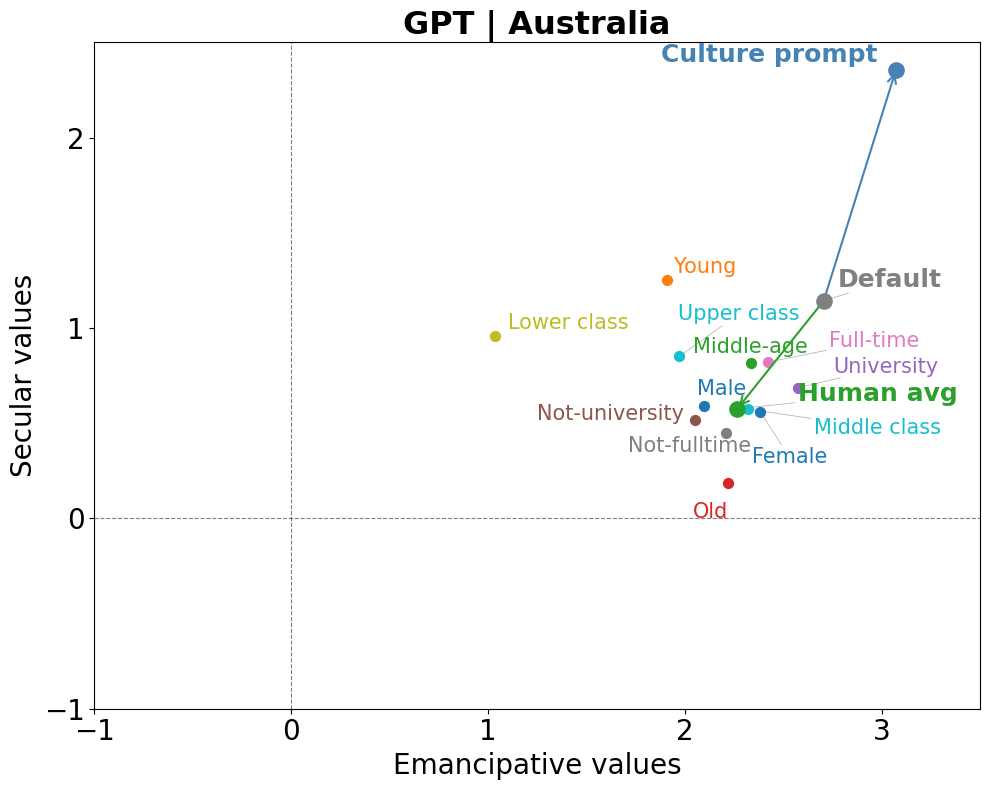

In [18]:
visualize_vector(ctry="Australia")

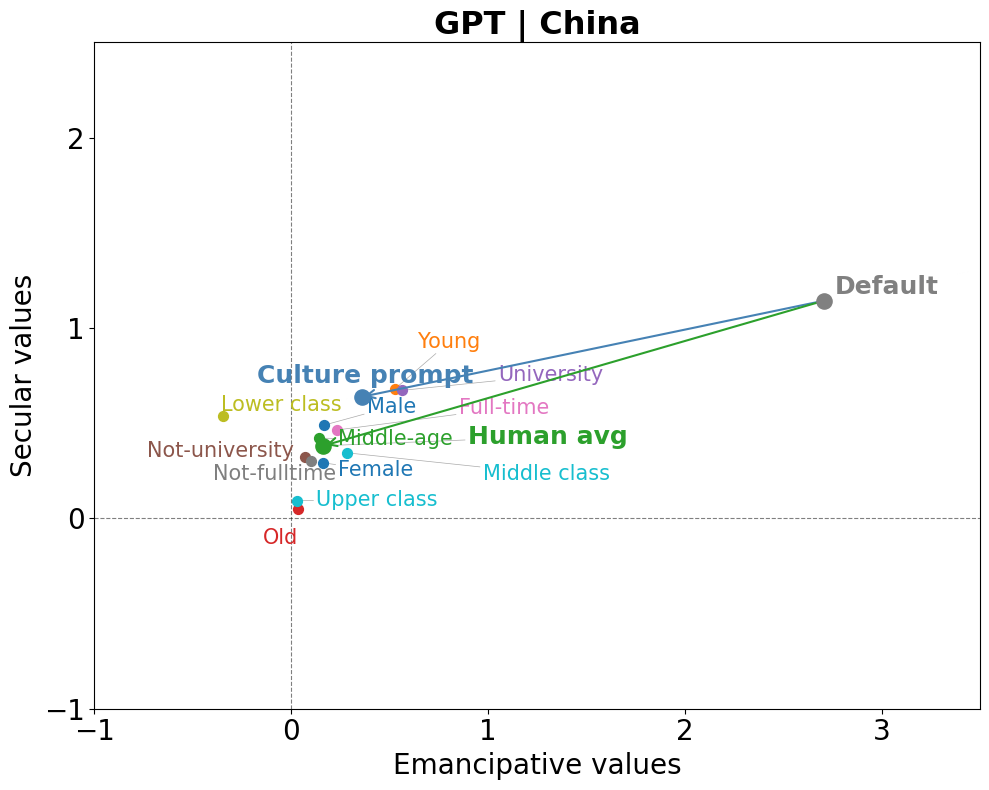

In [19]:
visualize_vector(ctry="China")

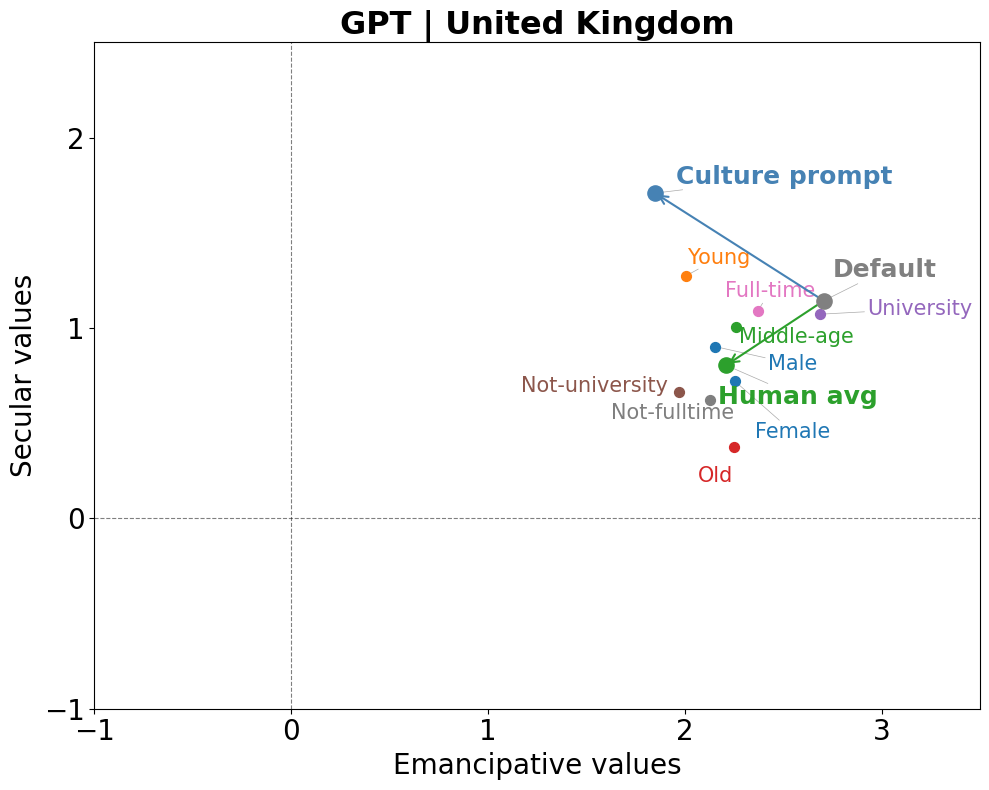

In [20]:
visualize_vector(ctry="United Kingdom")

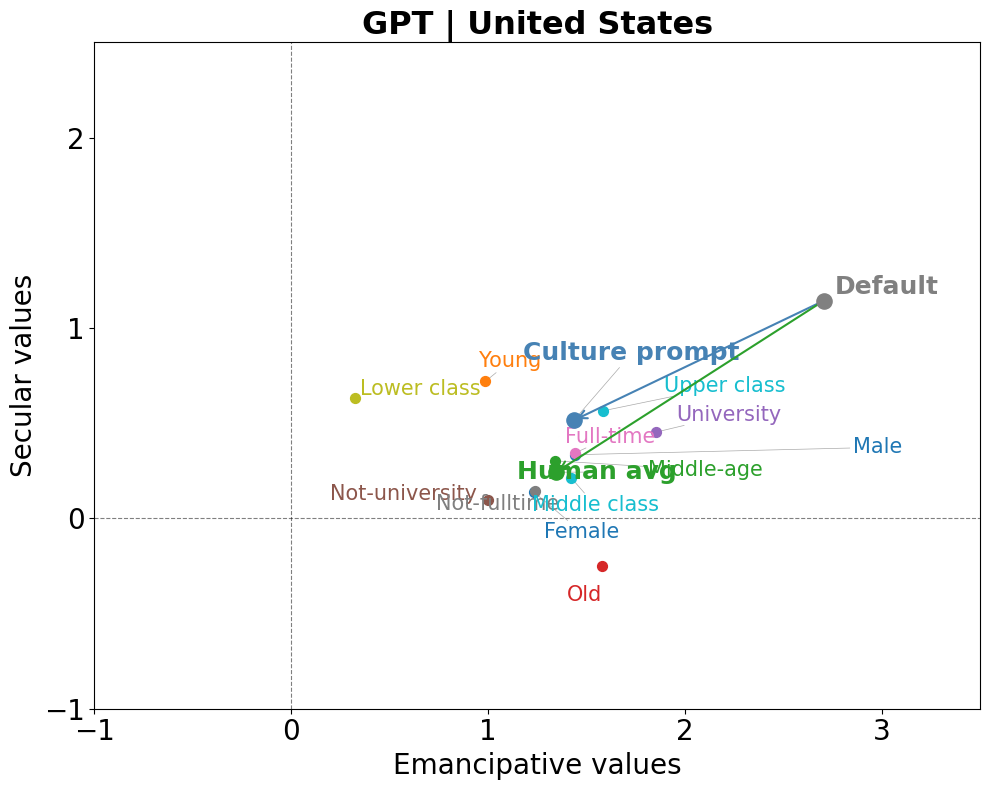

In [21]:
visualize_vector(ctry="United States")

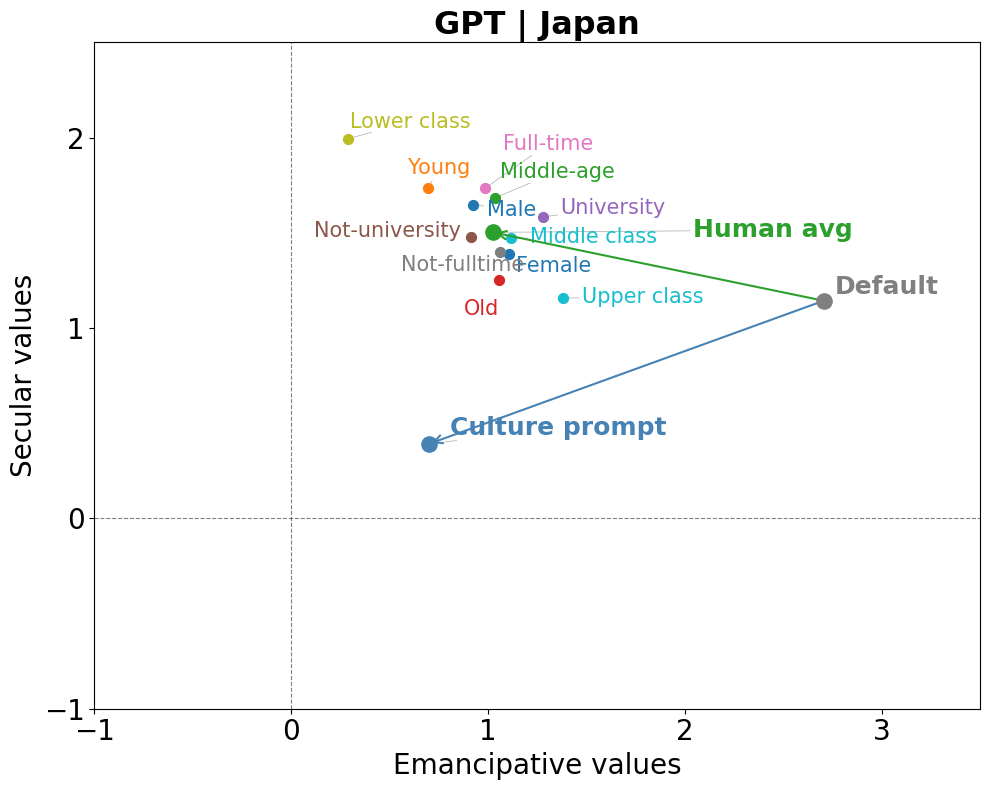

In [22]:
visualize_vector(ctry="Japan")

In [ ]:
def visualize_vector_byctry(czone):
    zone_to_countries_local = {}
    for ctry, zone in country_to_zone.items():
        zone_to_countries_local.setdefault(zone, []).append(ctry)

    ctries = [c for c in zone_to_countries_local.get(czone, []) if c in df_avg.index]

    demo_keys = ['M', 'F', 'youth', 'mid', 'old',
                 'university', 'not_university',
                 'fulltime', 'not_fulltime',
                 'lowcls', 'midcls', 'upcls']
    llm_default = df_llm.loc['model'][items].values
    llm_default_surv = survs_model.predict([llm_default])[0]
    llm_default_trad = trad_model.predict([llm_default])[0]

    # compute global axis range across all countries in the zone
    all_x, all_y = [0, llm_default_surv], [0, llm_default_trad]
    for ctry in ctries:
        for col in ['llm_culture', 'human_avg'] + demo_keys:
            val = df_ctry_igw.loc[ctry, col]
            if isinstance(val, tuple) and not any(np.isnan(v) for v in val):
                all_x.append(val[0]); all_y.append(val[1])
        # clf_surv = survs_model.predict(ctry_classifiers[ctry].coef_)[0]
        # clf_trad = trad_model.predict(ctry_classifiers[ctry].coef_)[0]
        # all_x.append(clf_surv); all_y.append(clf_trad)
    pad_x = max((max(all_x) - min(all_x)) * 0.12, 0.05)
    pad_y = max((max(all_y) - min(all_y)) * 0.12, 0.05)

    xlim = (min(all_x) - pad_x, max(all_x) + pad_x)
    ylim = (min(all_y) - pad_y, max(all_y) + pad_y)

    n_cols = 3
    n_rows = (len(ctries) + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(7 * n_cols, 6 * n_rows))
    axes = axes.flatten()

    for ax, ctry in zip(axes, ctries):
        visualize_vector(ctry, ax=ax, xlim=xlim, ylim=ylim)

    for ax in axes[len(ctries):]:
        ax.set_visible(False)

    fig.suptitle(f"{llm_name} | {czone}: IGW vector shift per country", fontsize=25, y=1.01)
    plt.tight_layout()
    # plt.savefig('./supfig/4A_'+czone+'.pdf', dpi=300, bbox_inches='tight')
    plt.show()

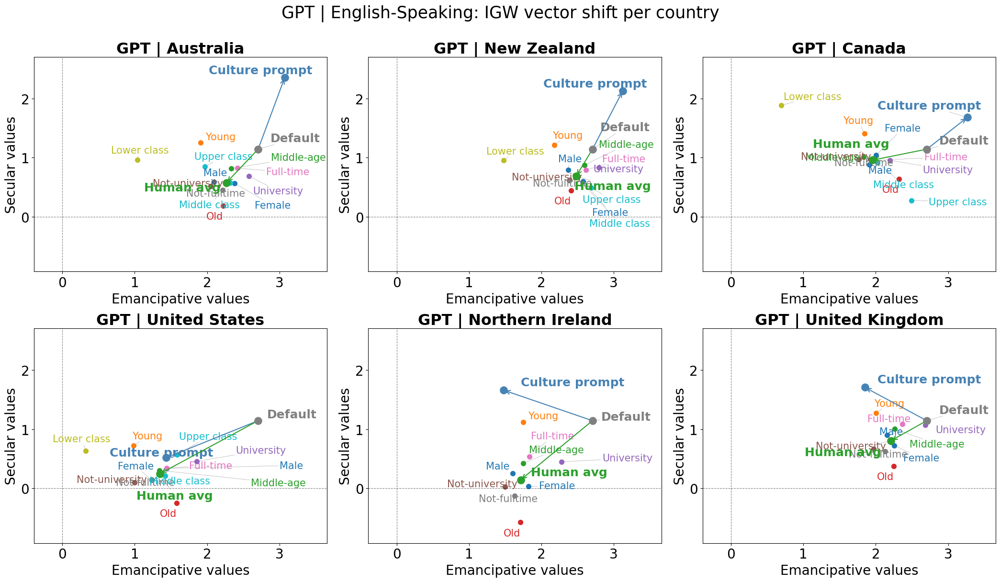

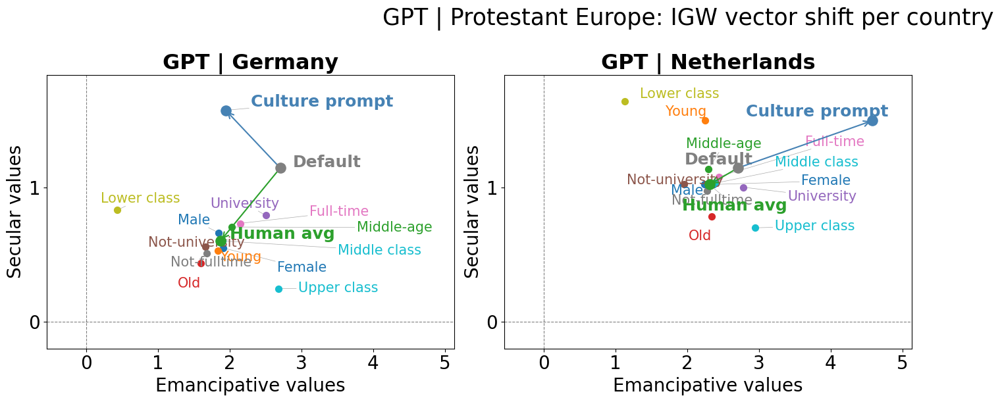

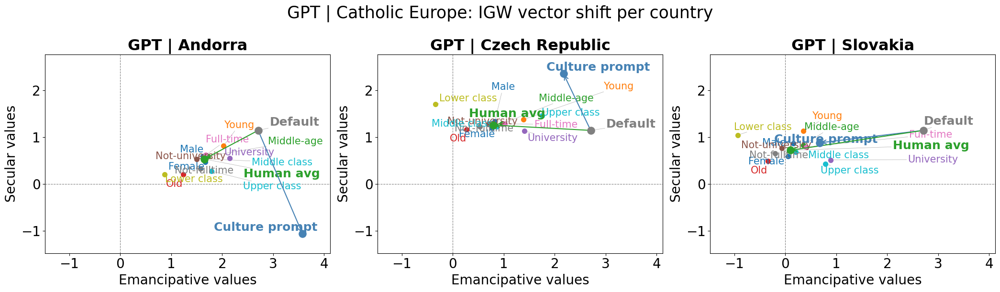

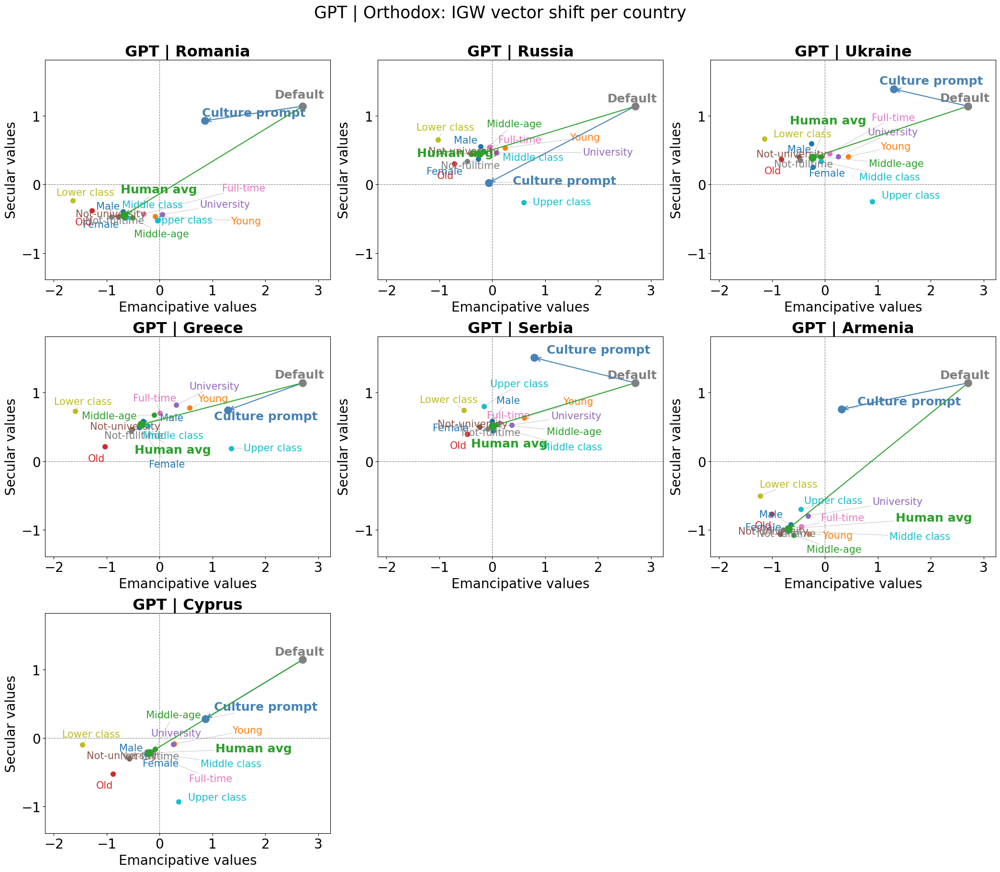

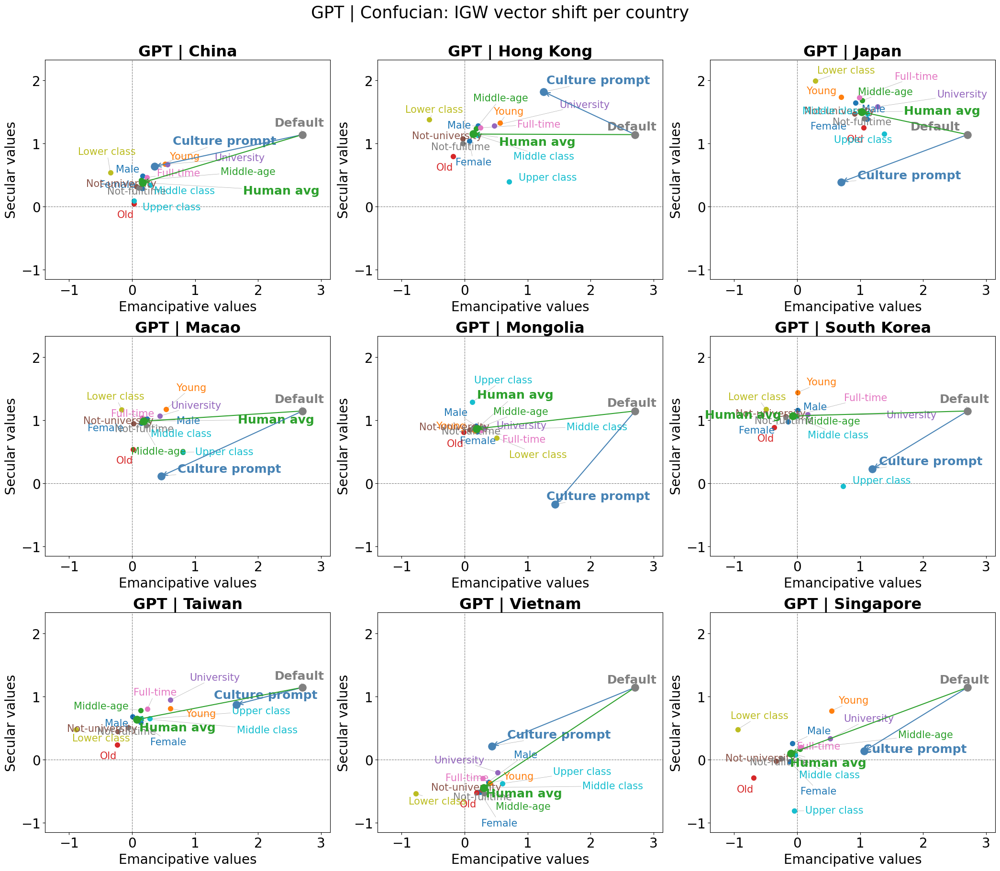

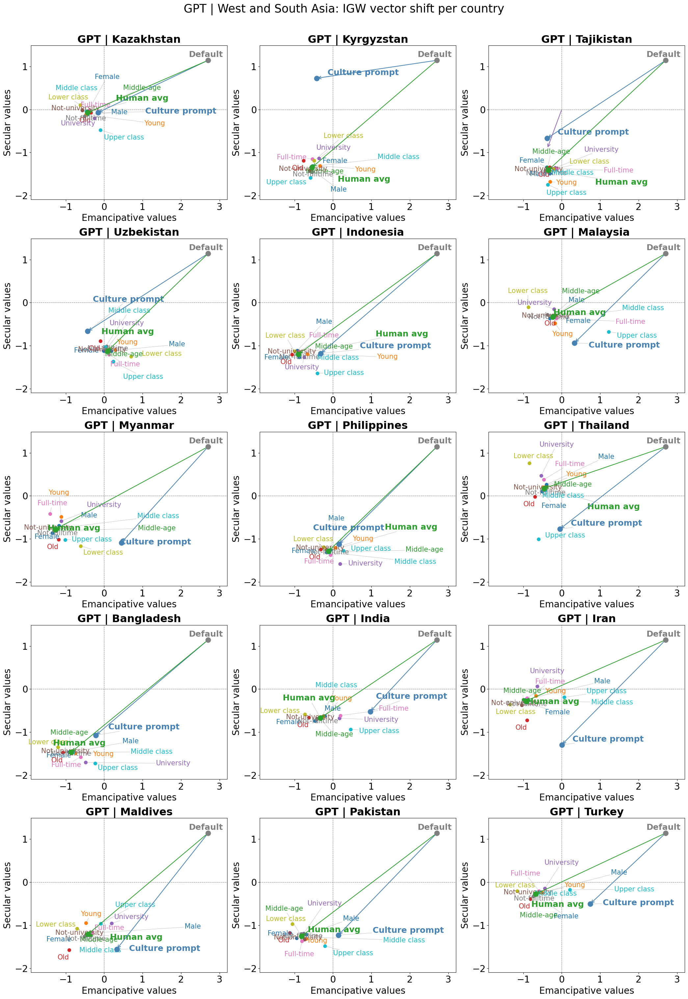

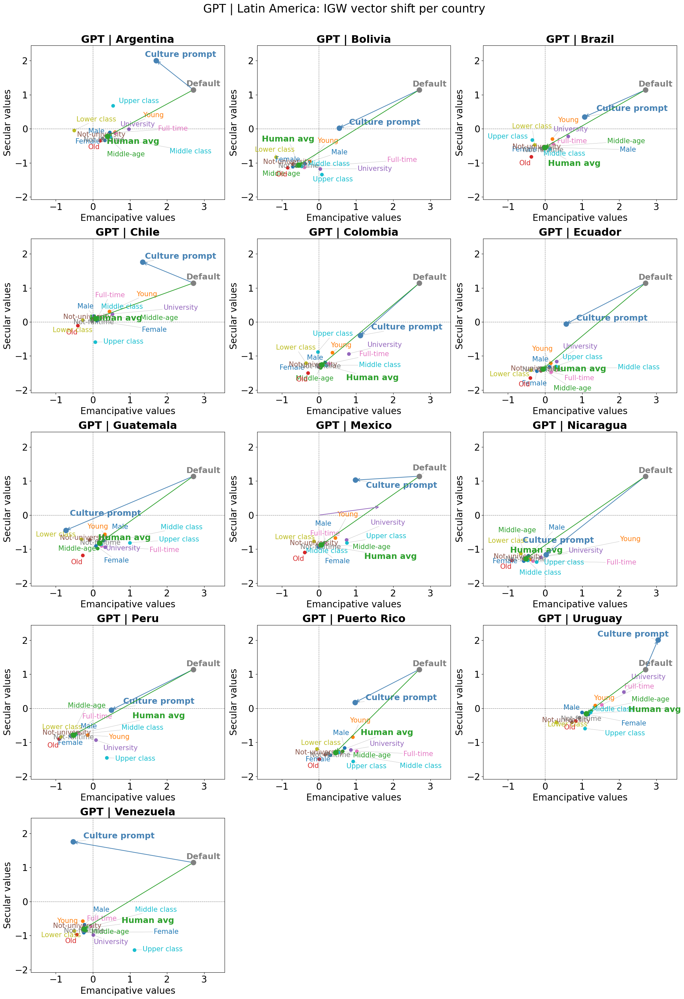

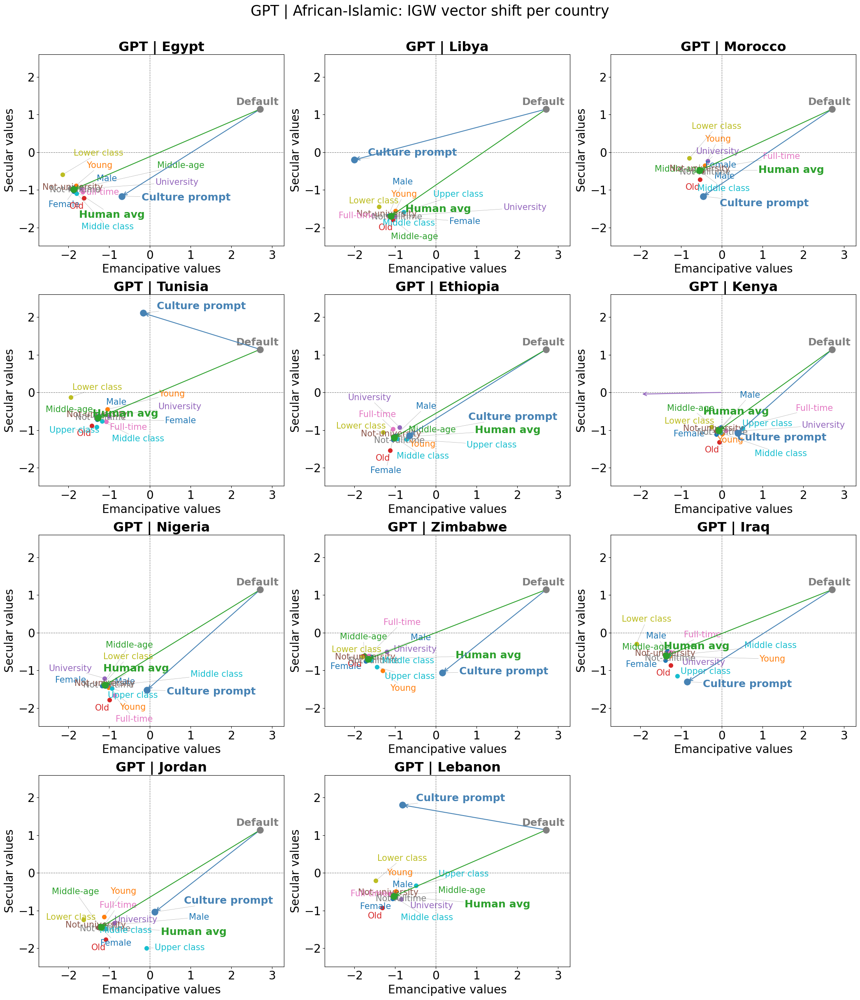

In [19]:
for czone in zone_to_countries:
    visualize_vector_byctry(czone)

In [ ]:
def summarize_vector_byczone(czone):
    # for a given czone, produce one image of the Inglehart-Welzel cultural map, 
    # df_ctry_igw, for each cell, the tuple shows the x-value and y-value 
    
    # human avg: df_ctry_igw.loc[ctry, human_avg], average over all countries in this cultural zone
    # cultural prompt: df_ctry_igw.loc[ctry, llm_culture], average over all countries in this cultural zone
    
    # default point
    llm_default = df_llm.loc['model'][items].values
    llm_default_surv = survs_model.predict([llm_default])[0]
    llm_default_trad = trad_model.predict([llm_default])[0]

    # map the three data points to the cultural map
    zone_to_countries_local = {}
    for ctry, zone in country_to_zone.items():
        zone_to_countries_local.setdefault(zone, []).append(ctry)

    ctries = [c for c in zone_to_countries_local.get(czone, []) if c in df_ctry_igw.index]

    # average surv/trad across all countries in the zone
    culture_pts = [df_ctry_igw.loc[c, 'llm_culture'] for c in ctries
                   if not any(np.isnan(v) for v in df_ctry_igw.loc[c, 'llm_culture'])]
    human_pts   = [df_ctry_igw.loc[c, 'human_avg'] for c in ctries
                   if not any(np.isnan(v) for v in df_ctry_igw.loc[c, 'human_avg'])]

    culture_surv = np.mean([p[0] for p in culture_pts])
    culture_trad = np.mean([p[1] for p in culture_pts])
    human_surv   = np.mean([p[0] for p in human_pts])
    human_trad   = np.mean([p[1] for p in human_pts])

    main_points = {
        "Default":        (llm_default_surv, llm_default_trad, "grey"),
        "Culture (avg)":  (culture_surv,     culture_trad,     "steelblue"),
        "Human (avg)":    (human_surv,        human_trad,       "#2ca02c"),
    }

    fig, ax = plt.subplots(figsize=(10, 8))

    # individual country dots (smaller, semi-transparent)
    texts = []
    for c in ctries:
        cs, ct = df_ctry_igw.loc[c, 'llm_culture']
        hs, ht = df_ctry_igw.loc[c, 'human_avg']
        ax.scatter(cs, ct, color="steelblue", s=20, alpha=0.5, zorder=2)
        ax.scatter(hs, ht, color="#2ca02c",   s=20, alpha=0.5, zorder=2)
        if c == 'Northern Ireland':
            ax.text(cs, ct, c, fontsize=15, color="steelblue", alpha=0.8, ha='right', va='top')
            ax.text(hs, ht, c, fontsize=15, color="#2ca02c",   alpha=0.8, ha='right', va='top')
        elif c == 'United States':
            ax.text(cs-0.3, ct+0.05, c, fontsize=15, color="steelblue", alpha=0.8)
            ax.text(hs-0.3, ht+0.05, c, fontsize=15, color="#2ca02c",   alpha=0.8)
        elif c == 'China':
            ax.text(cs-0.6, ct+0.05, c, fontsize=15, color="steelblue", alpha=0.8)
            ax.text(hs-0.3, ht+0.05, c, fontsize=15, color="#2ca02c",   alpha=0.8)
        elif c == 'Taiwan':
            ax.text(cs, ct, c, fontsize=15, color="steelblue", alpha=0.8)
            ax.text(hs, ht+0.1, c, fontsize=15, color="#2ca02c",   alpha=0.8)
        elif c == 'Japan':
            ax.text(cs-0.1, ct+0.05, c, fontsize=15, color="steelblue", alpha=0.8)
            ax.text(hs, ht, c, fontsize=15, color="#2ca02c",   alpha=0.8)
        else:
            texts.append(ax.text(cs, ct, c, fontsize=15, color="steelblue", alpha=0.8))
            texts.append(ax.text(hs, ht, c, fontsize=15, color="#2ca02c",   alpha=0.8))

    # averaged main points
    for label, (sx, ty, color) in main_points.items():
        ax.scatter(sx, ty, color=color, s=120, zorder=4)
        ax.text(sx, ty-0.07, f"  {label}", fontsize=18, va="center", color=color, fontweight="bold")

    # arrows: default → culture avg, default → human avg
    for (x0, y0), (x1, y1), color in [
        ((llm_default_surv, llm_default_trad), (culture_surv, culture_trad), "steelblue"),
        ((llm_default_surv, llm_default_trad), (human_surv,   human_trad),   "#2ca02c"),
    ]:
        ax.annotate("", xy=(x1, y1), xytext=(x0, y0),
                    arrowprops=dict(arrowstyle="->", color=color, lw=2, mutation_scale=16))

    ax.axhline(0, color="black", linewidth=0.8, linestyle="--", alpha=0.5)
    ax.axvline(0, color="black", linewidth=0.8, linestyle="--", alpha=0.5)

    # use this for "English-speaking and confucian"
    # ax.set_xlim(-1, 3.5)
    # ax.set_ylim(-1, 2.5)

    adjust_text(texts, ax=ax, arrowprops=dict(arrowstyle="-", color="#aaa", lw=0.5))

    ax.set_xlabel("Emancipative values", fontsize=20)
    ax.set_ylabel("Secular values", fontsize=20)
    ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))
    ax.yaxis.set_major_locator(plt.MaxNLocator(integer=True))
    ax.tick_params(axis='both', labelsize=20)

    # ax.set_title(f"{llm_name} | averaged shift for {czone} countries", fontsize=22, fontweight="bold")
    ax.set_title(f"{czone}", fontsize=22, fontweight="bold")
    plt.tight_layout()
    # plt.savefig('./supfig/4B_'+czone+'.pdf', dpi=300, bbox_inches='tight')
            
    plt.show()

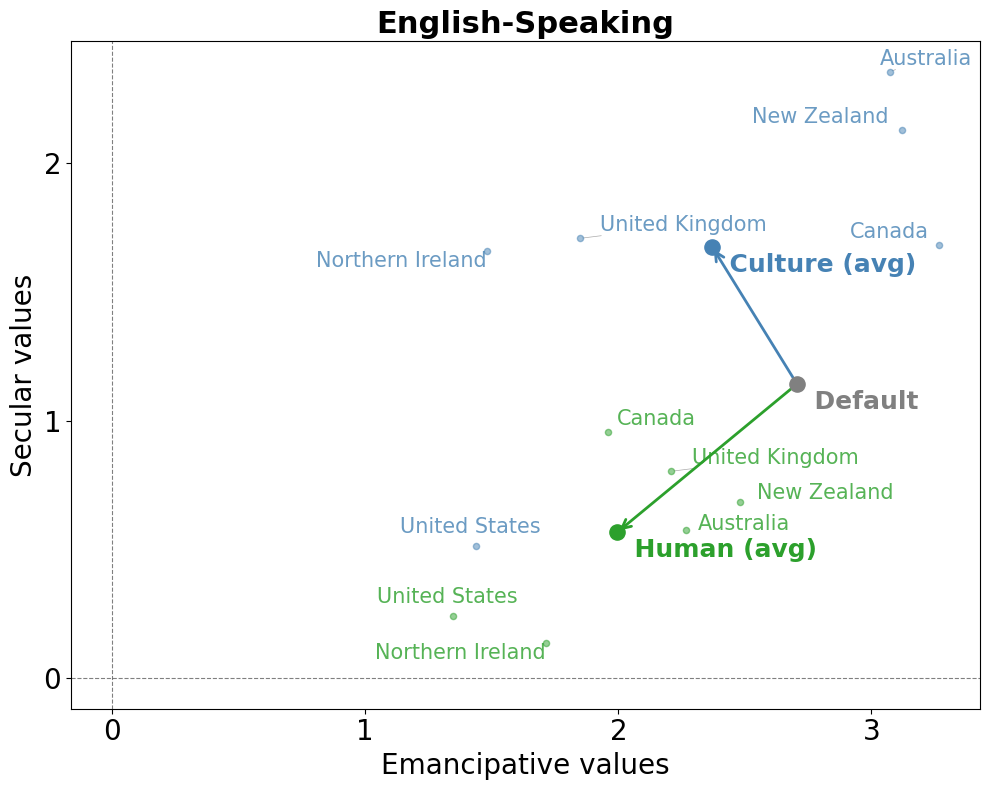

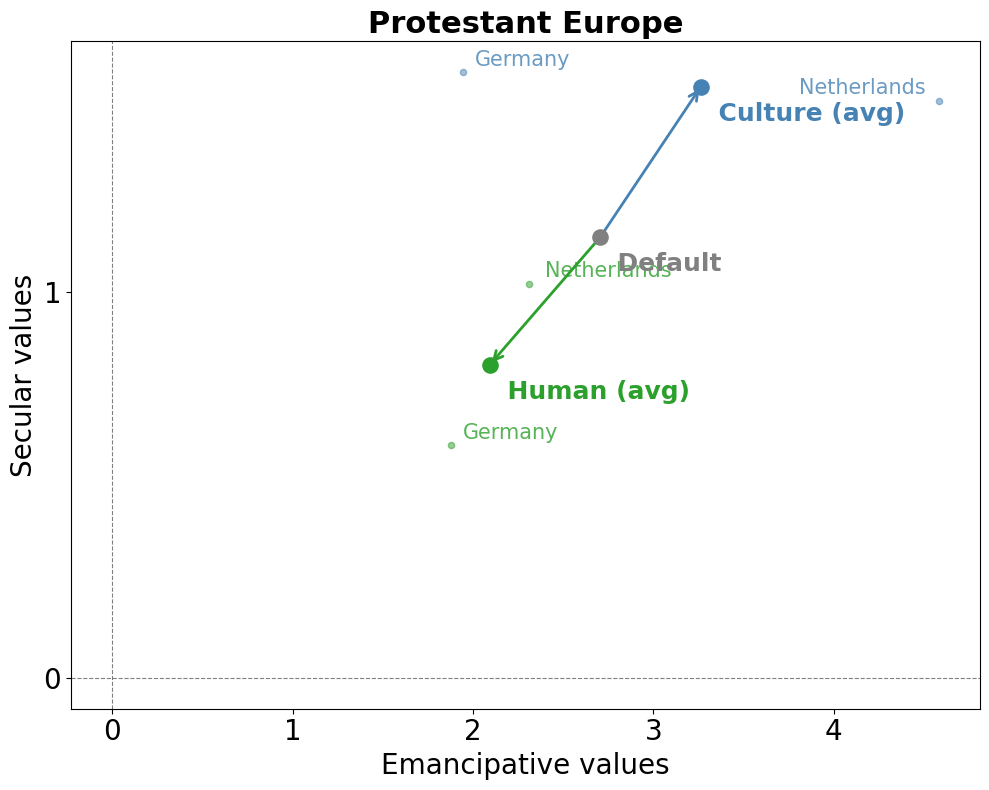

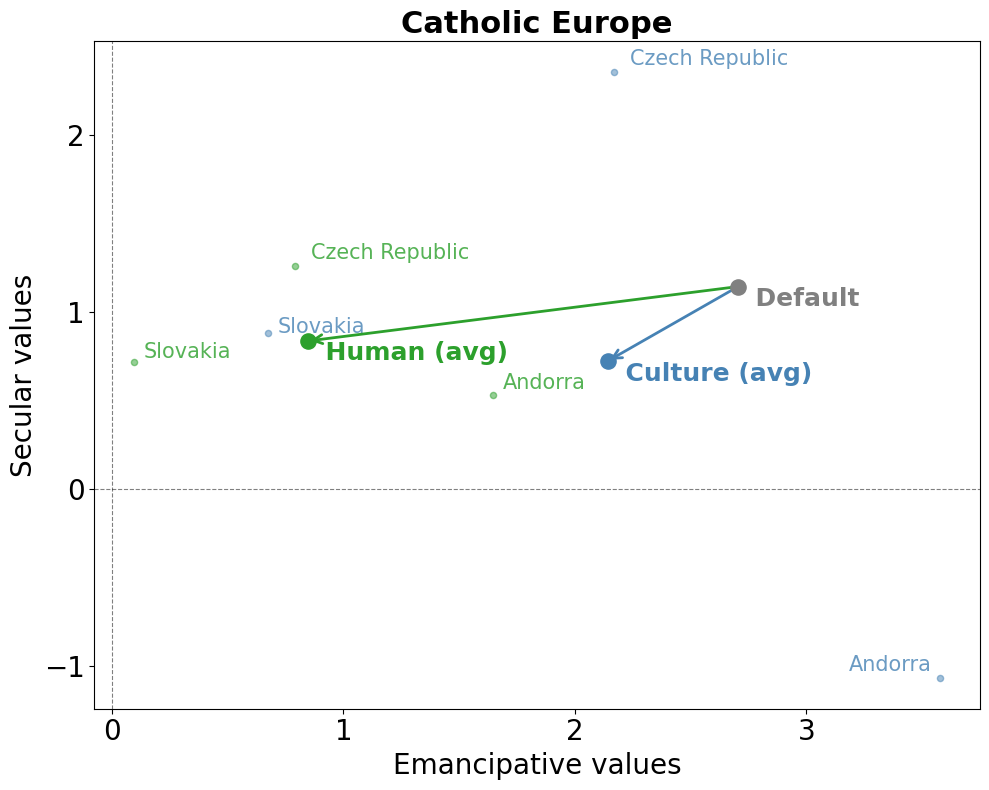

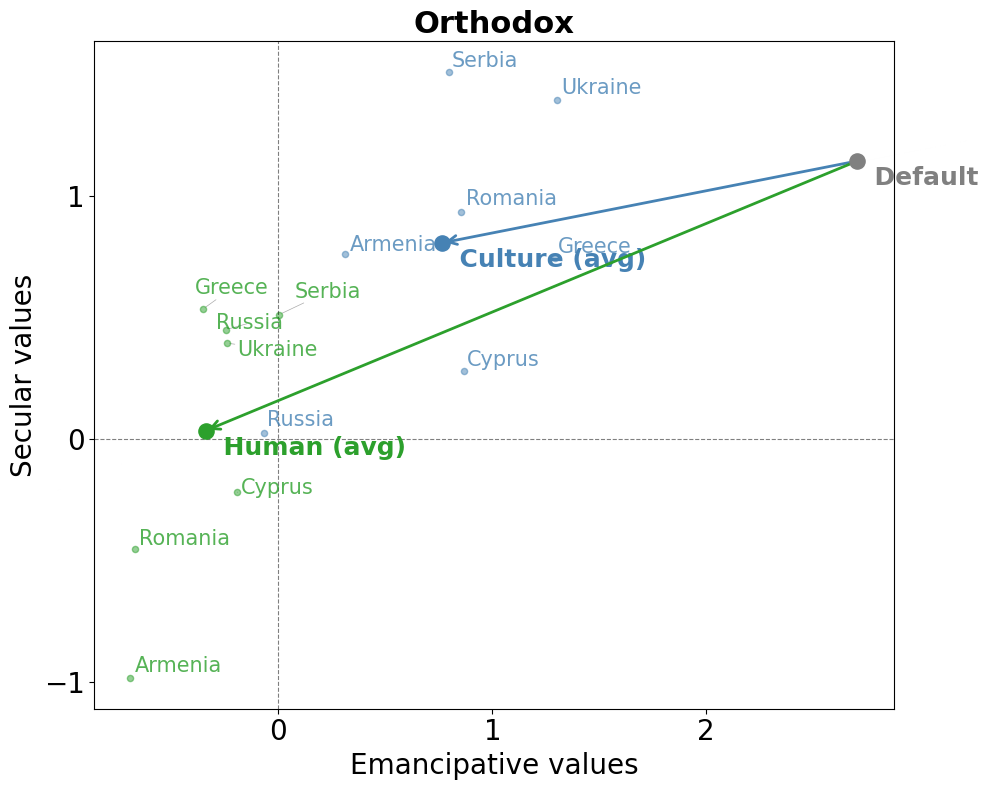

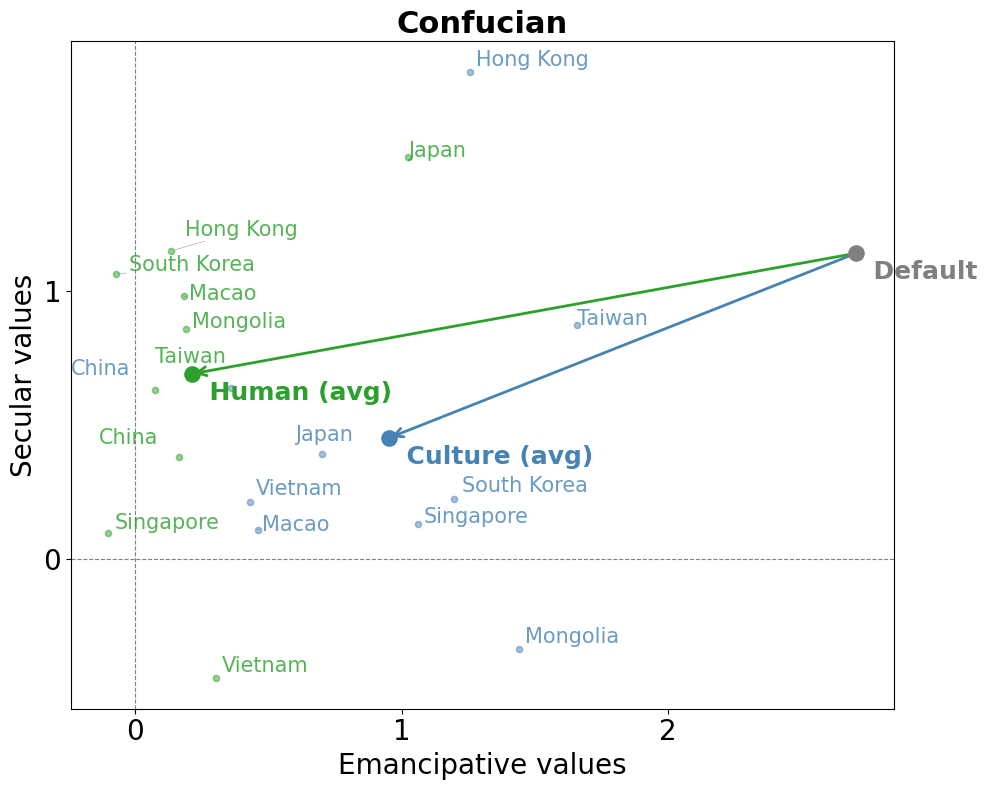

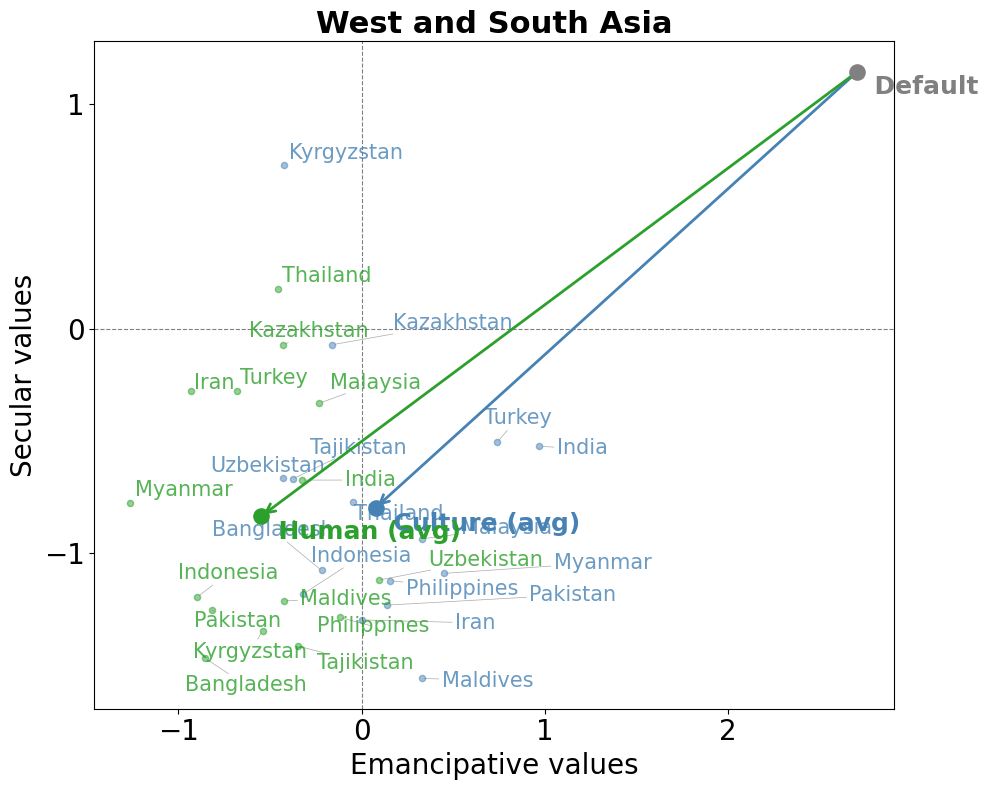

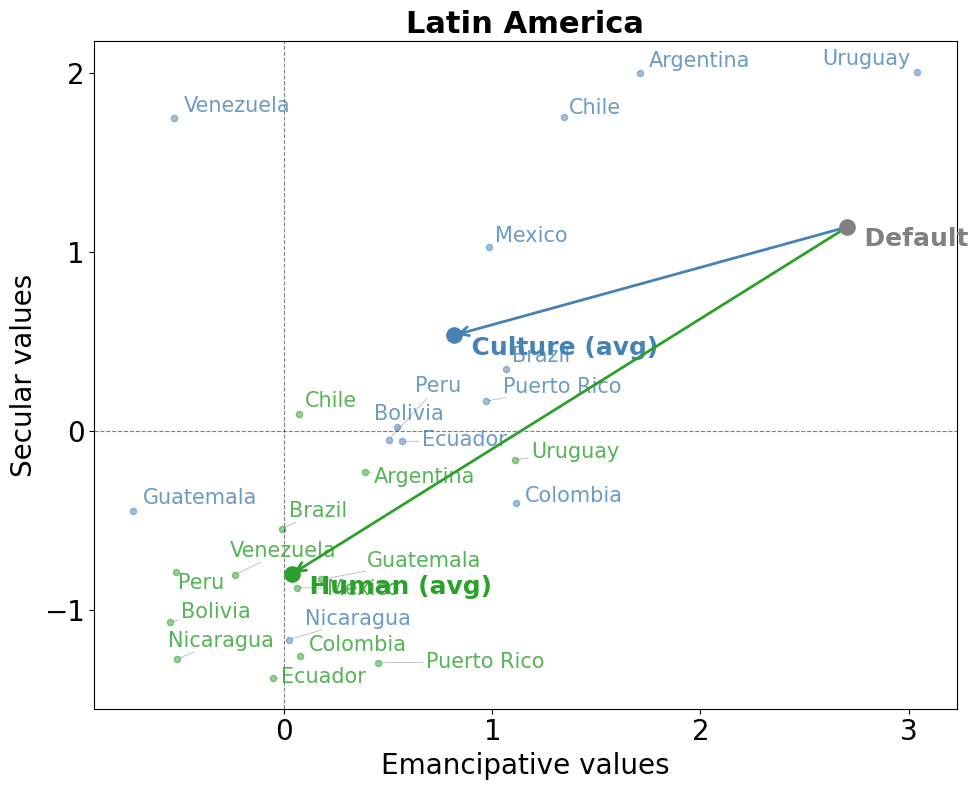

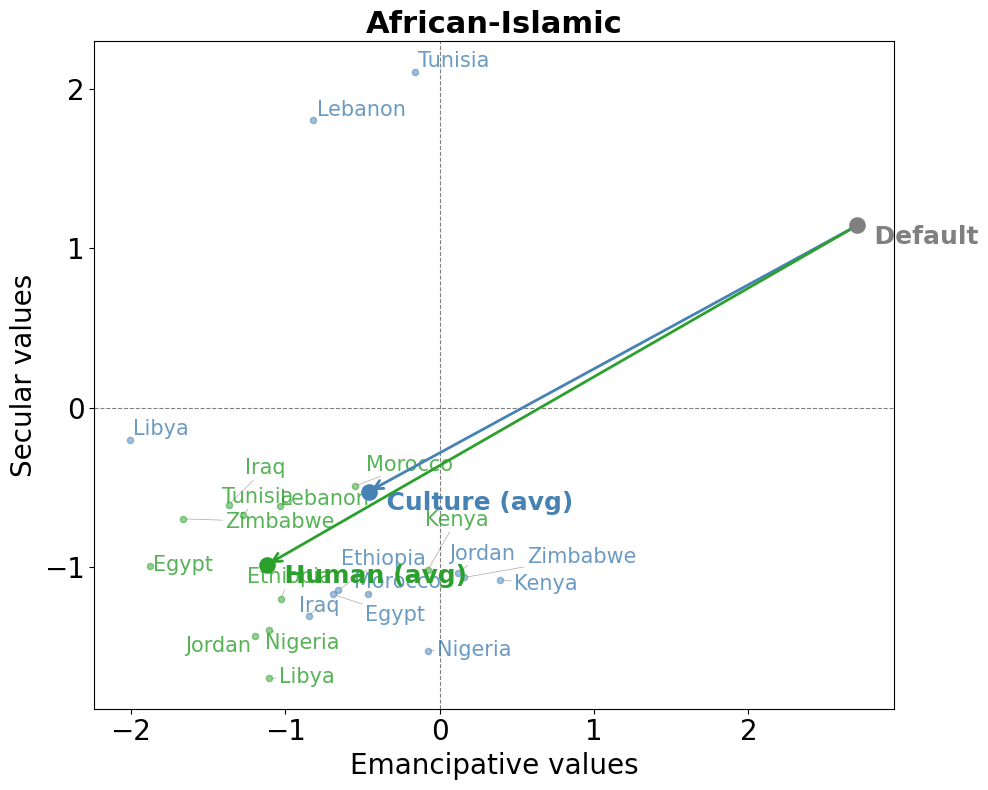

In [27]:
for czone in zone_to_countries:
    summarize_vector_byczone(czone)

### Replicate Results for Claude

In [28]:
llm_name = "Claude" 
df_llm = df_claude 

In [ ]:
with open("./data/"+llm_name+"_ctry_igw_scores.pkl", "rb") as f:
    df_ctry_igw = pickle.load(f)

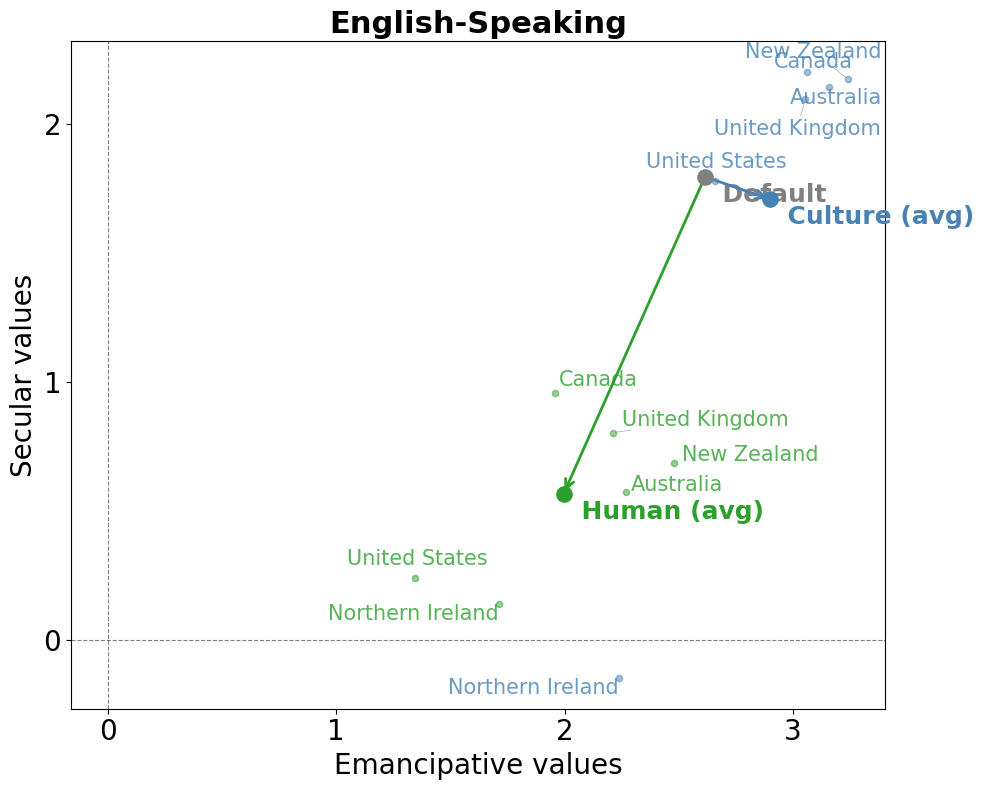

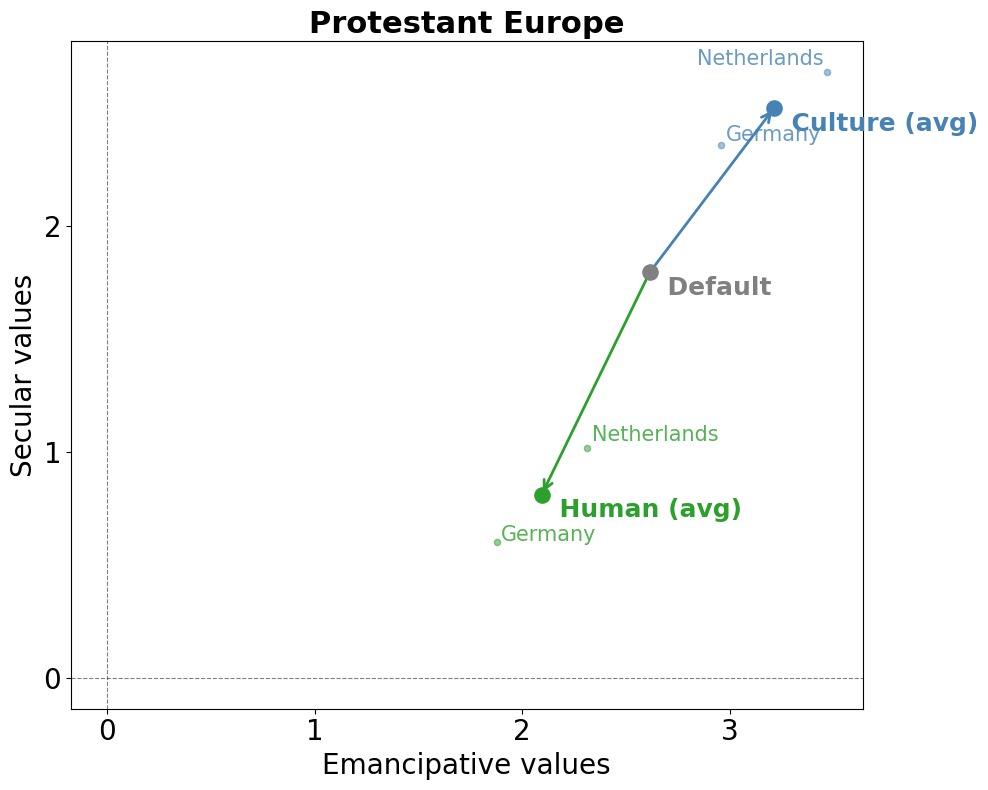

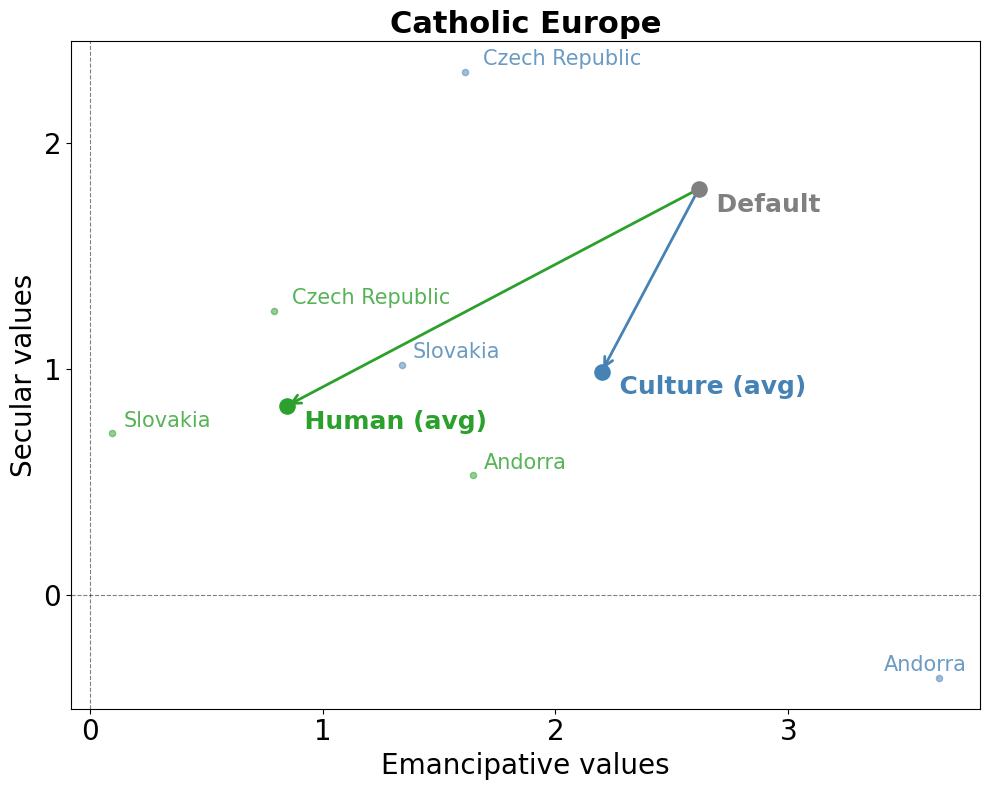

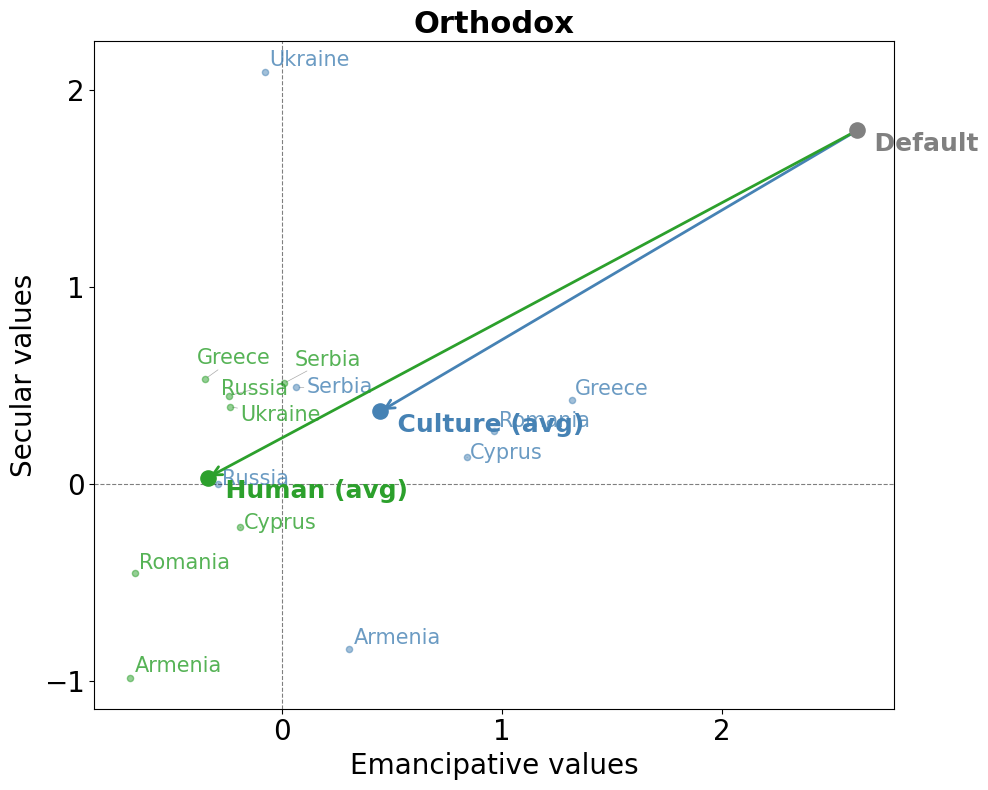

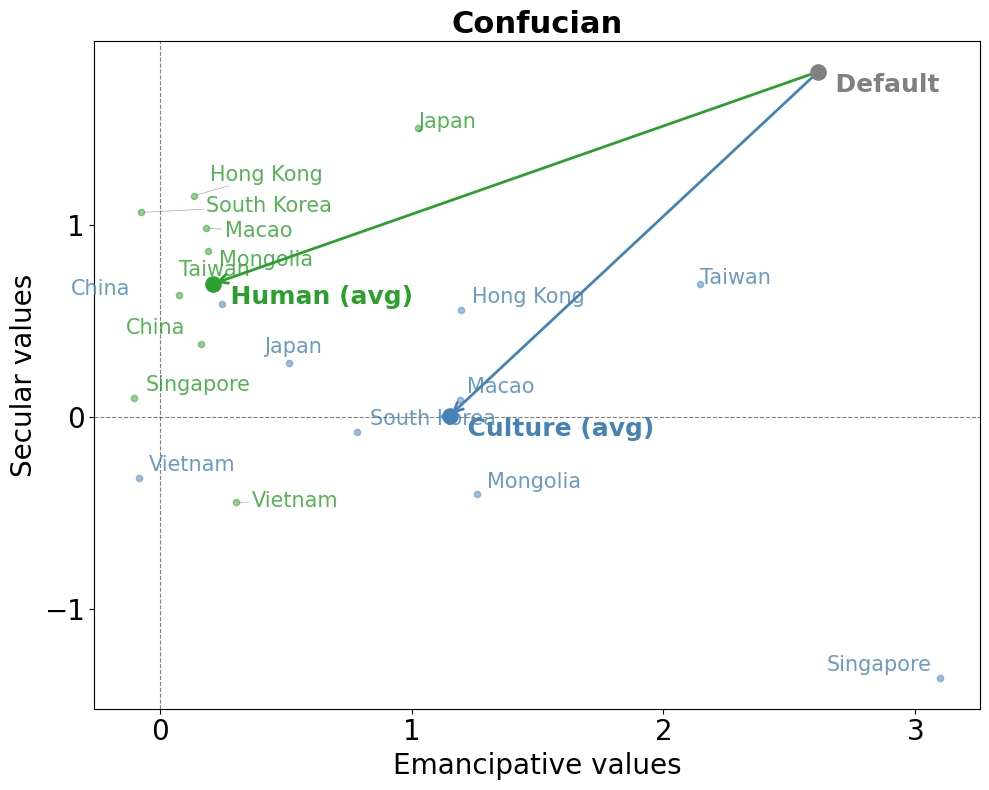

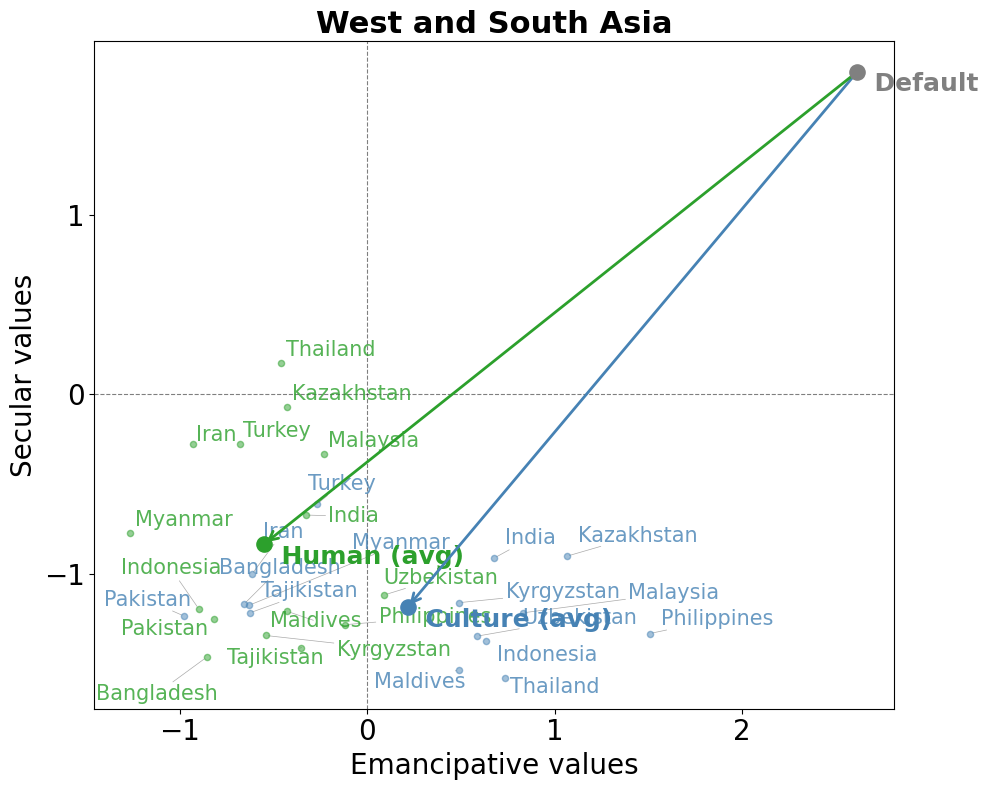

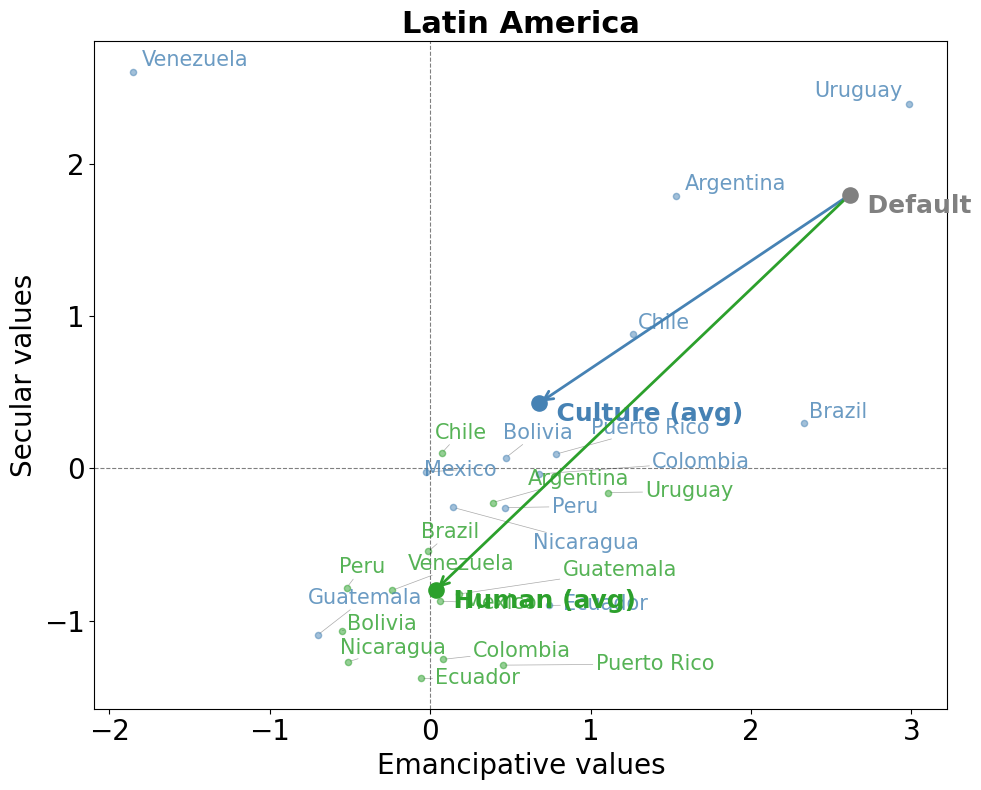

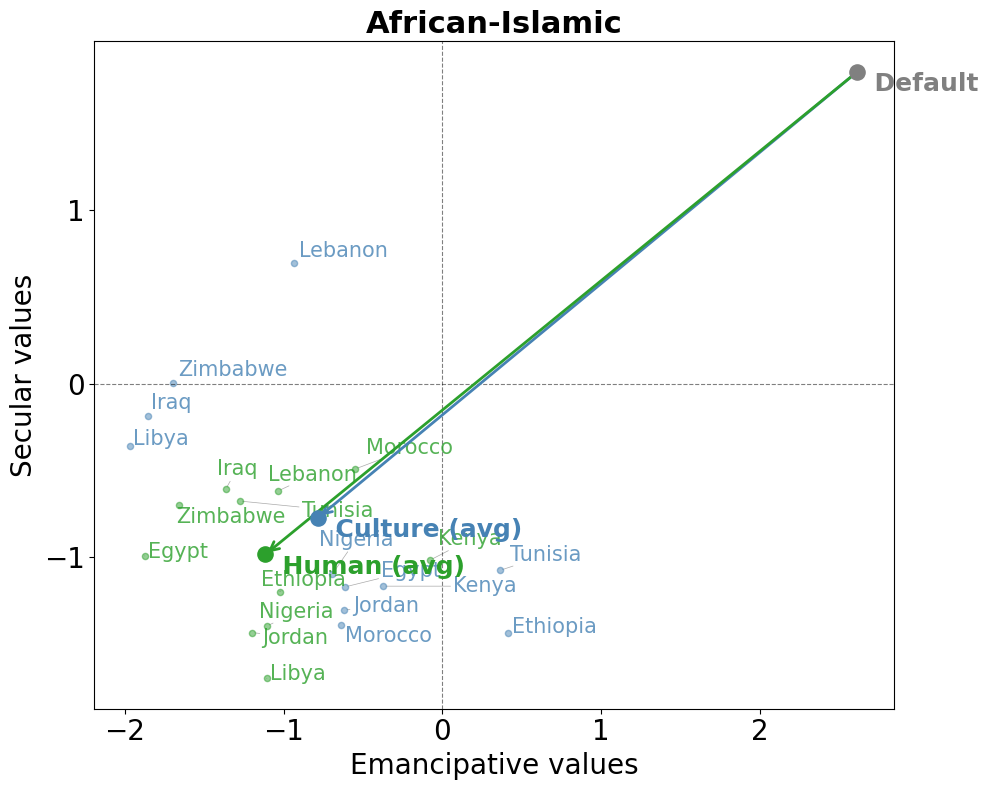

In [30]:
for czone in zone_to_countries:
    summarize_vector_byczone(czone)

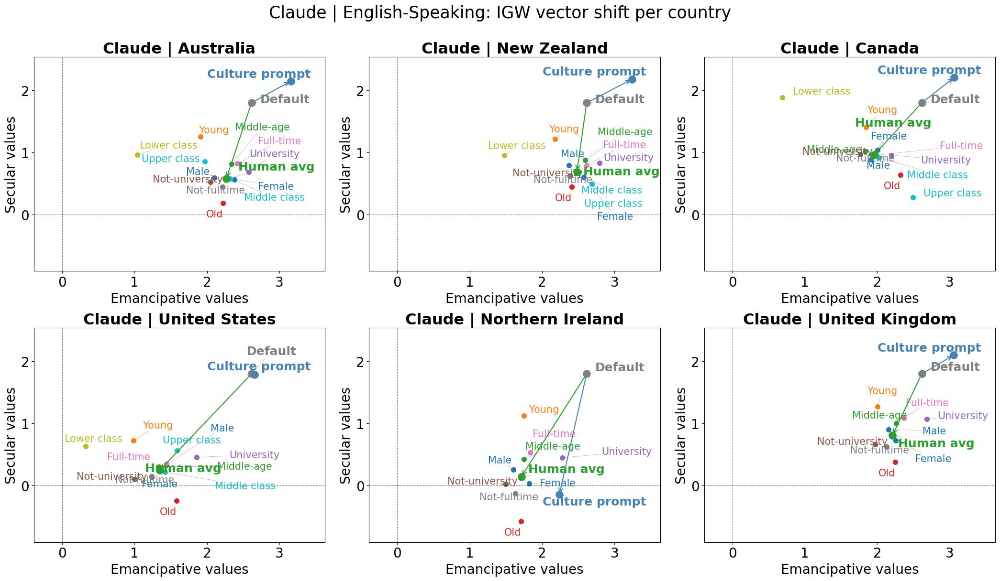

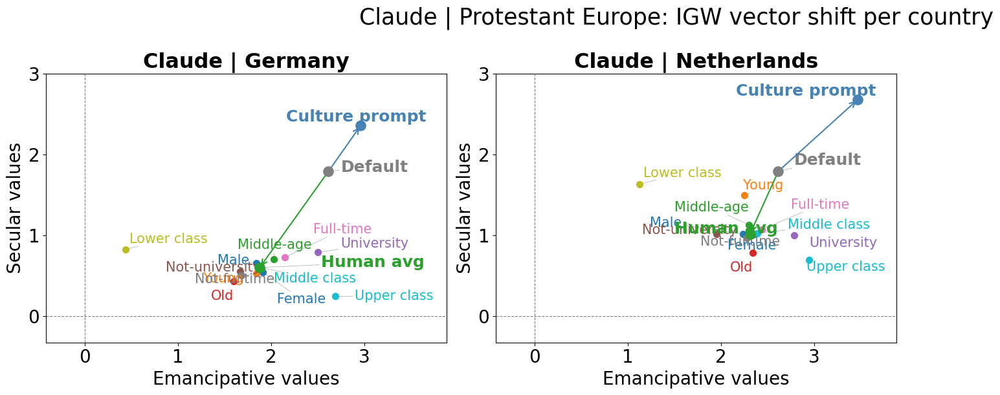

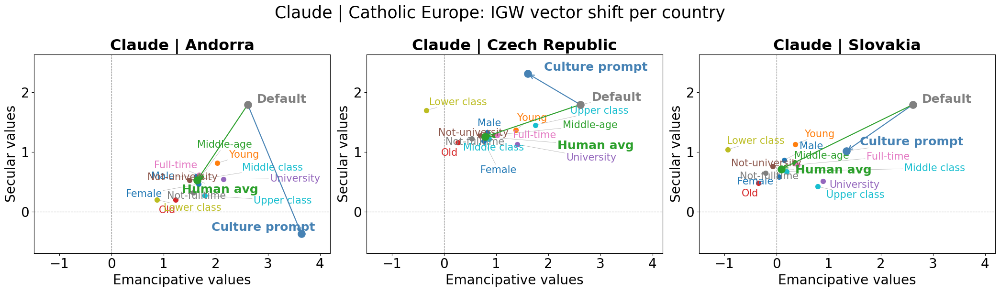

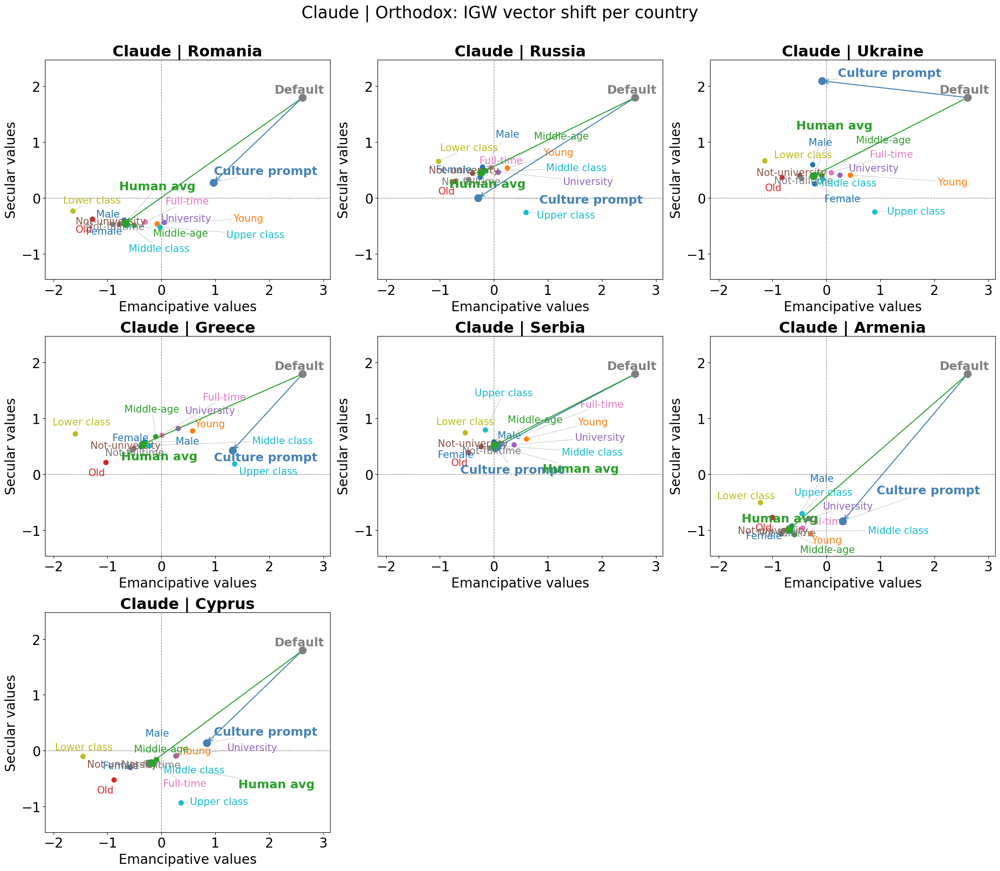

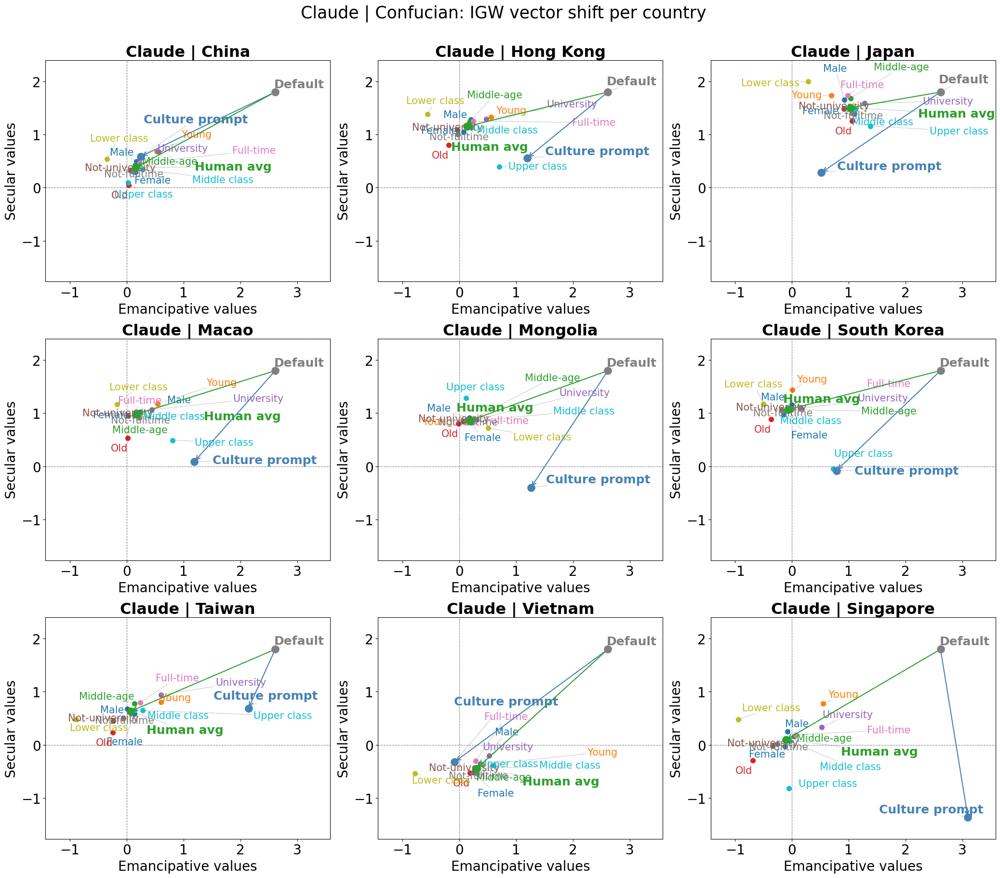

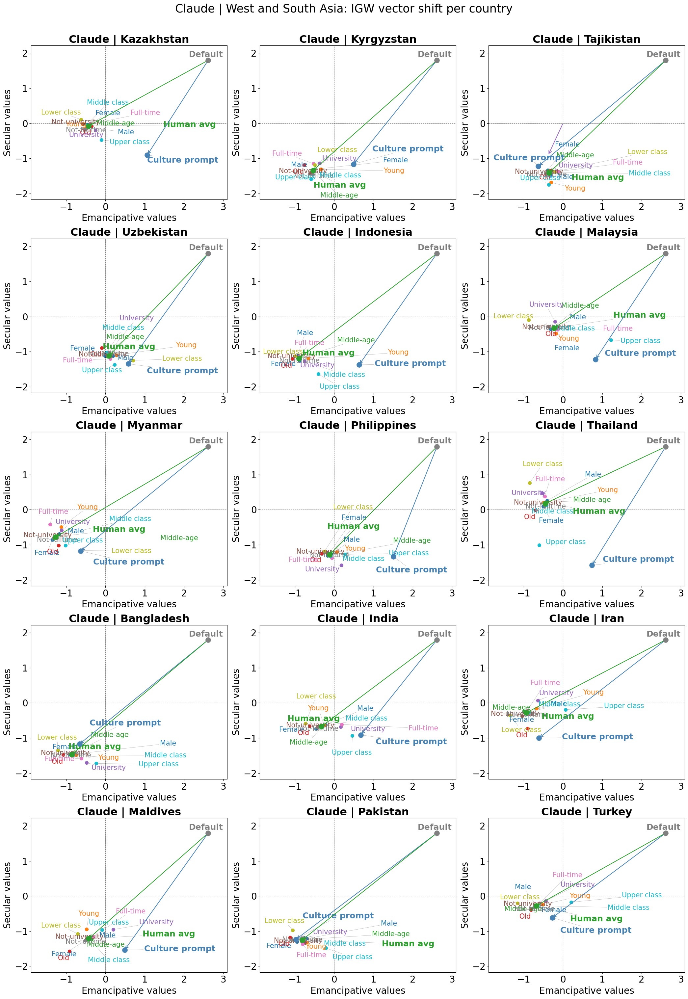

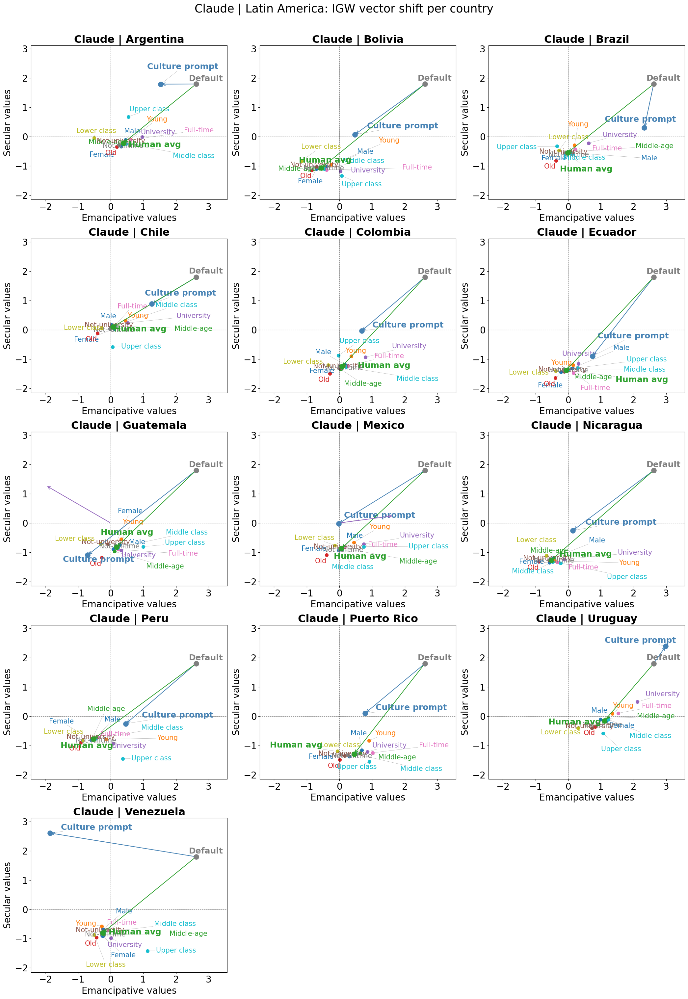

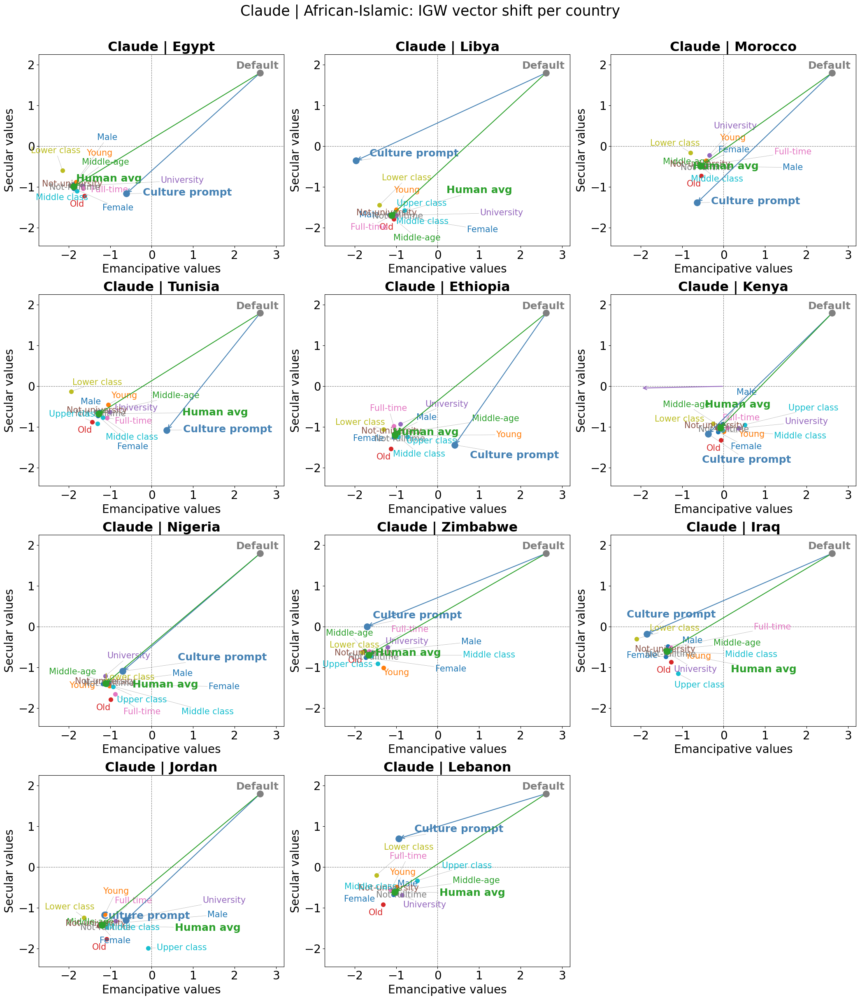

In [31]:
for czone in zone_to_countries:
    visualize_vector_byctry(czone)

### Replicate Results for DeepSeek

In [32]:
llm_name = "DeepSeek"
df_llm = df_deepseek

In [ ]:
with open("./data/"+llm_name+"_ctry_igw_scores.pkl", "rb") as f:
    df_ctry_igw = pickle.load(f)

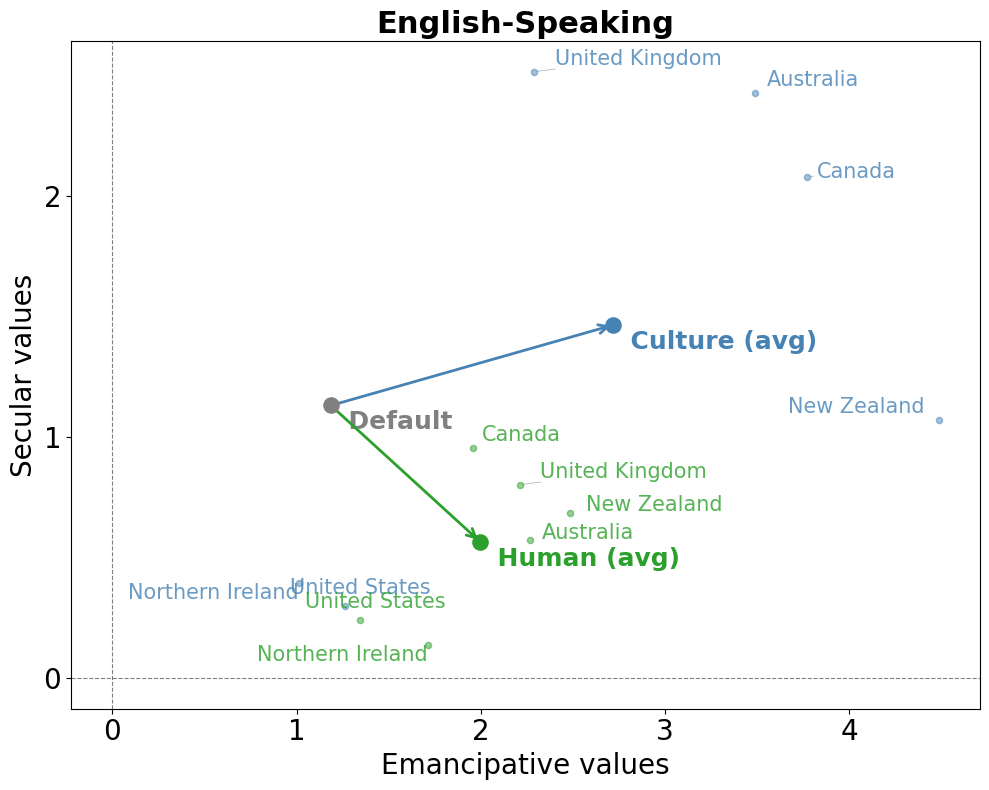

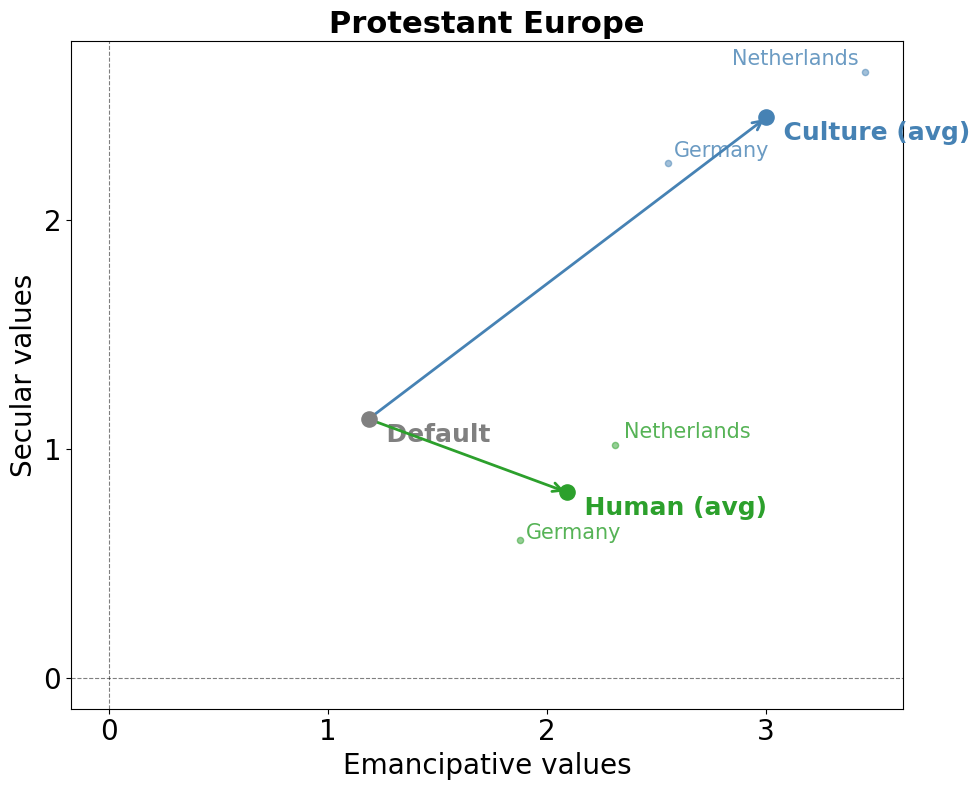

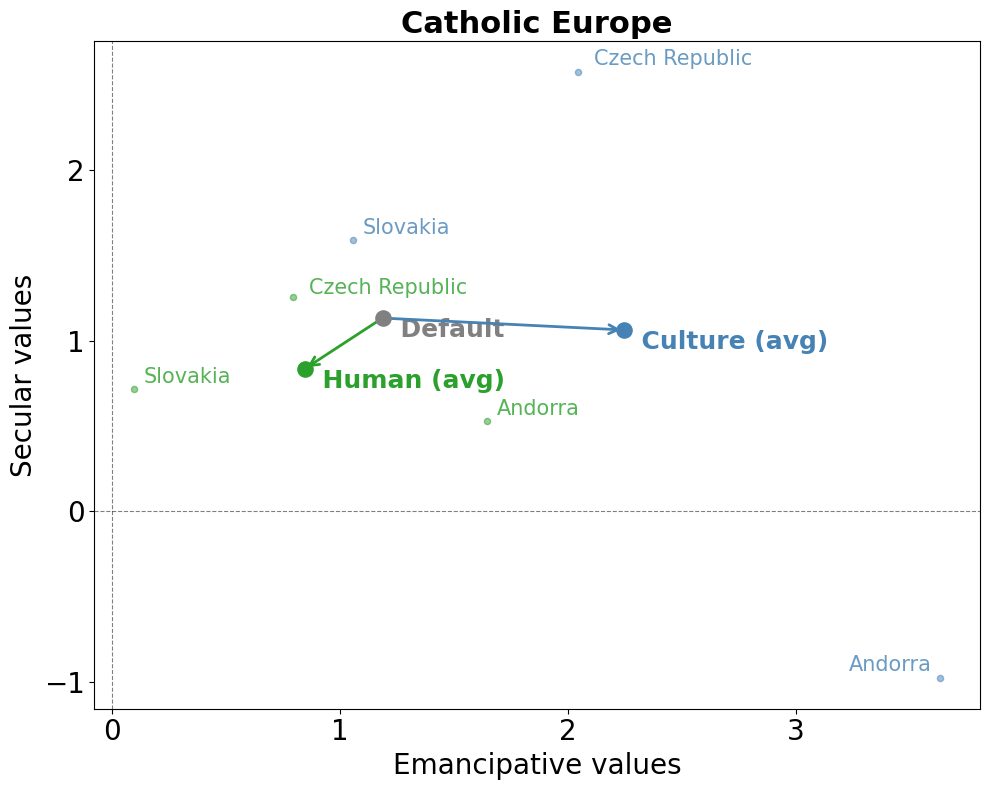

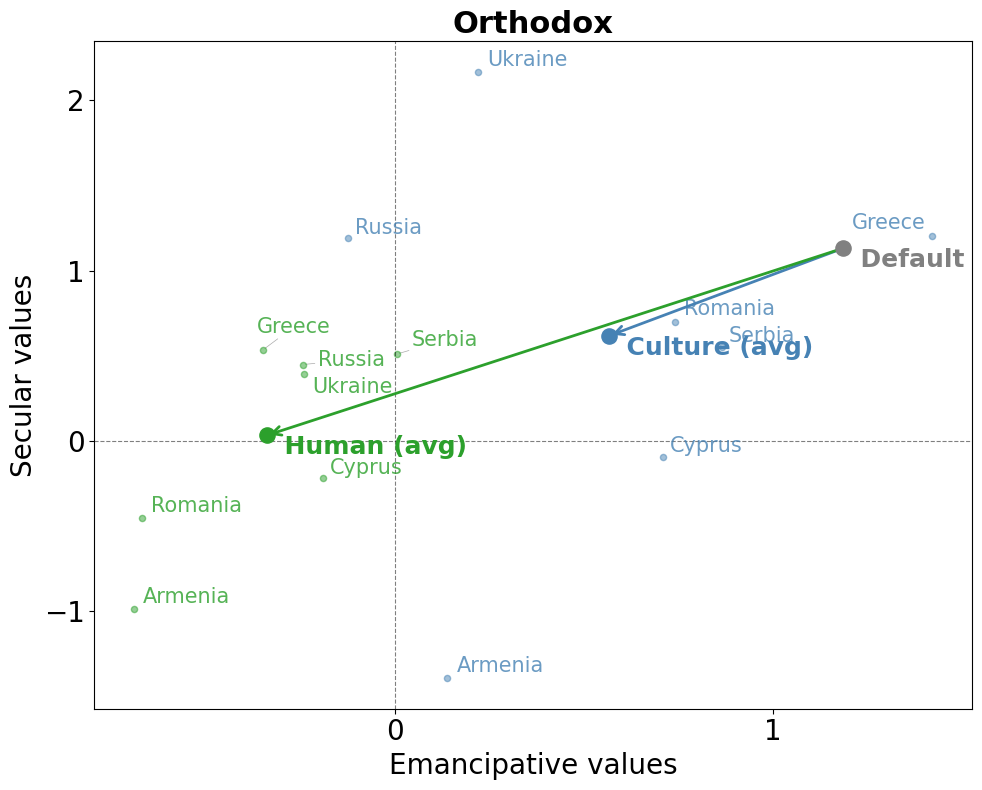

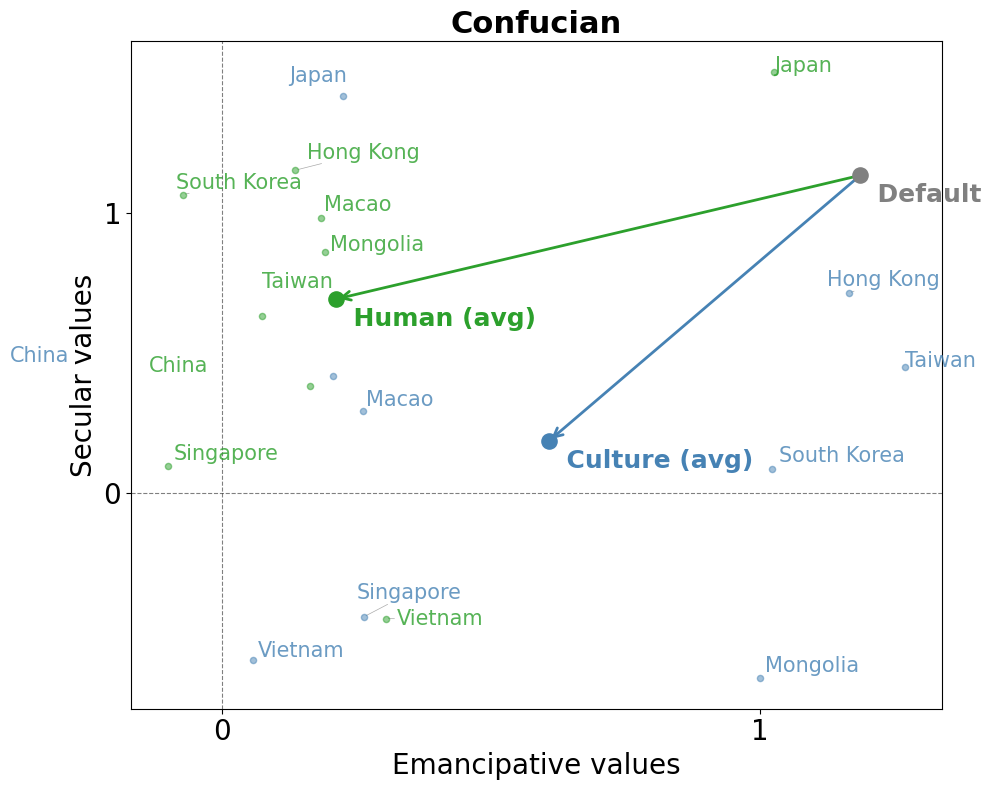

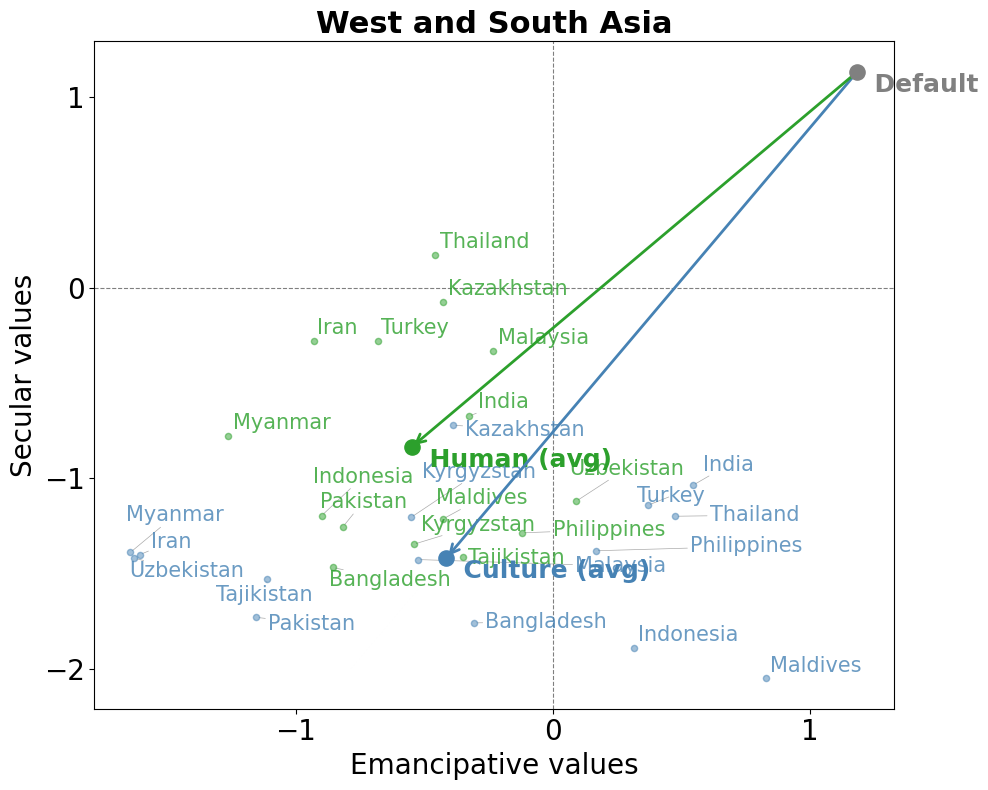

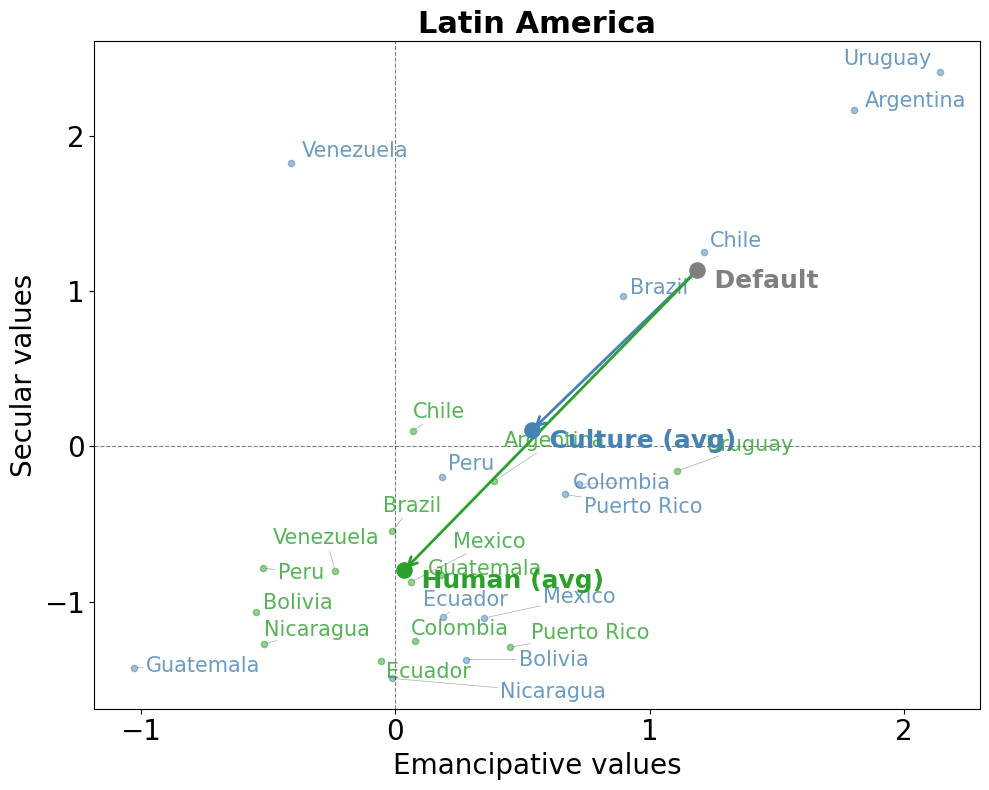

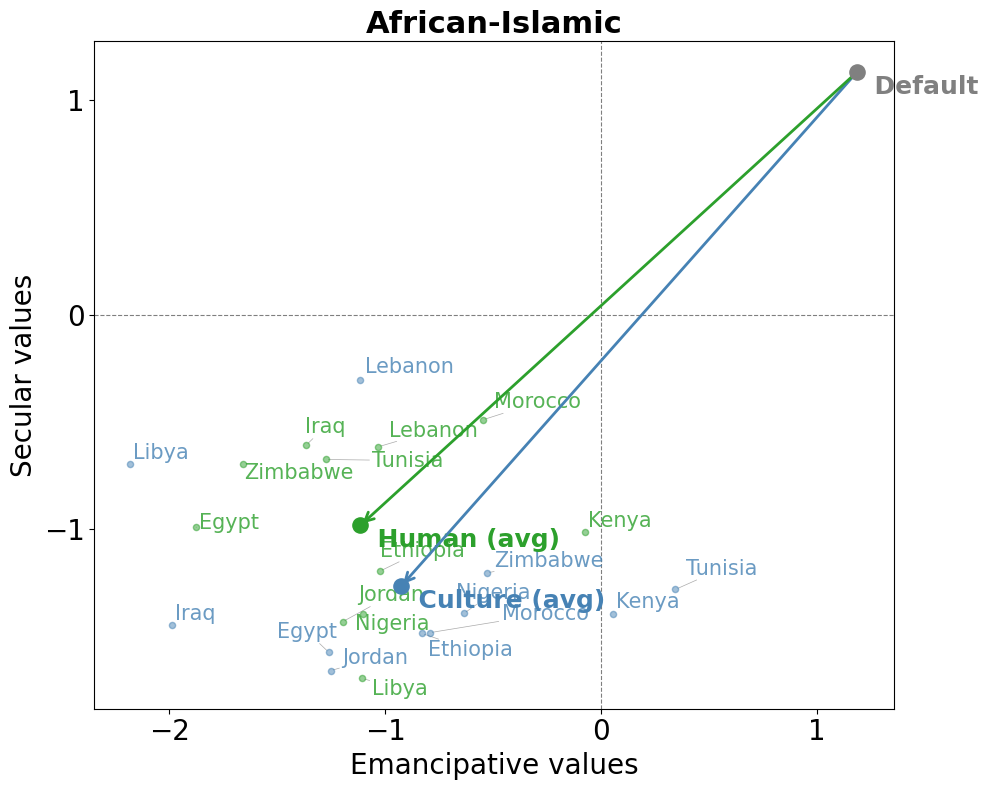

In [34]:
for czone in zone_to_countries:
    summarize_vector_byczone(czone)

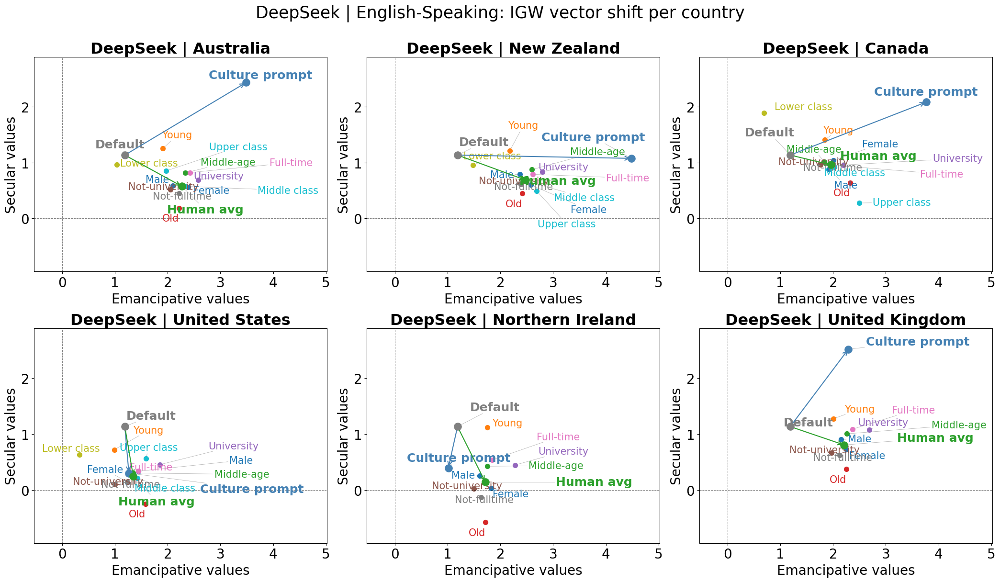

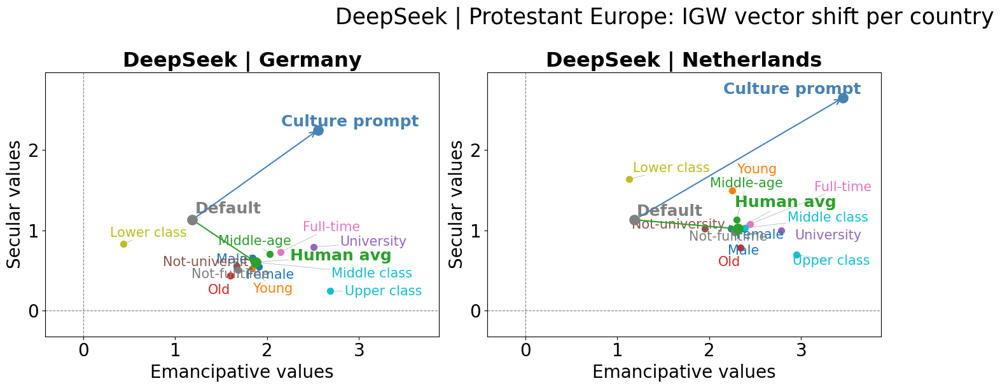

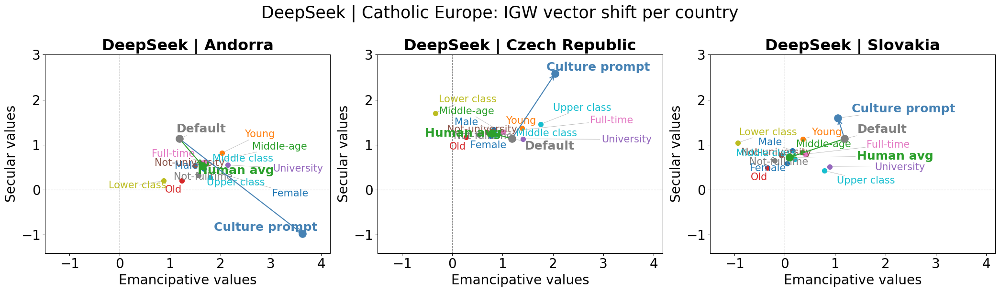

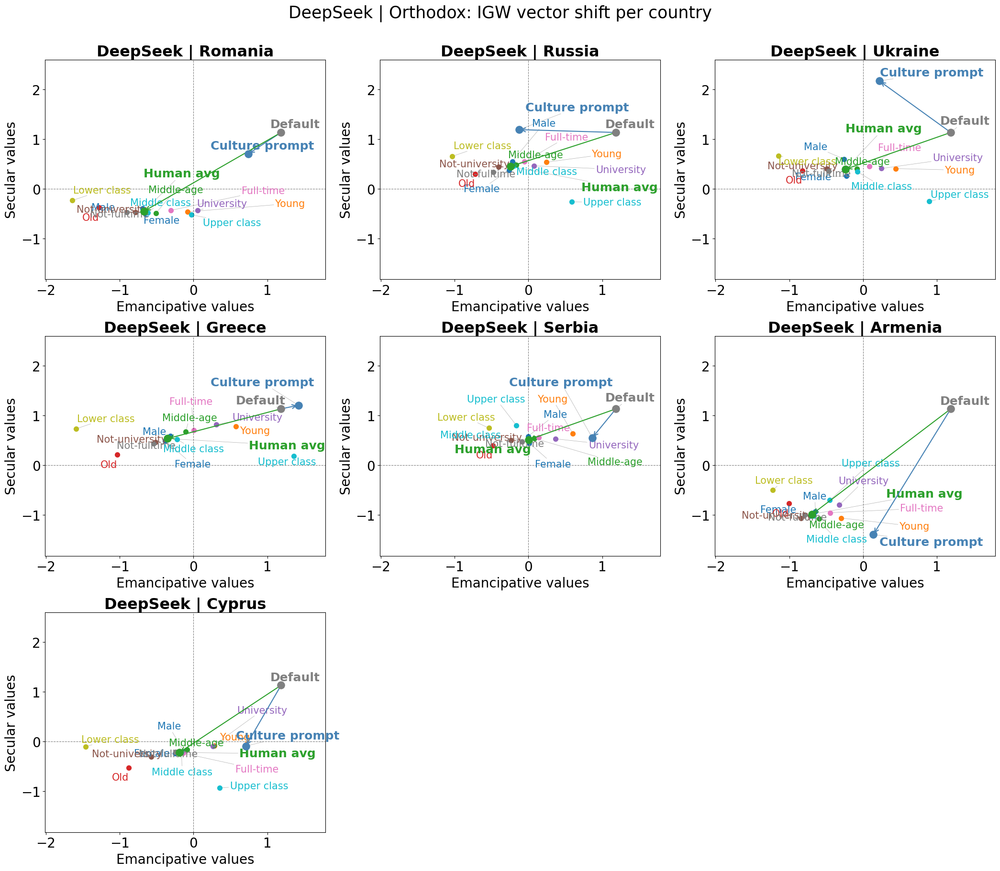

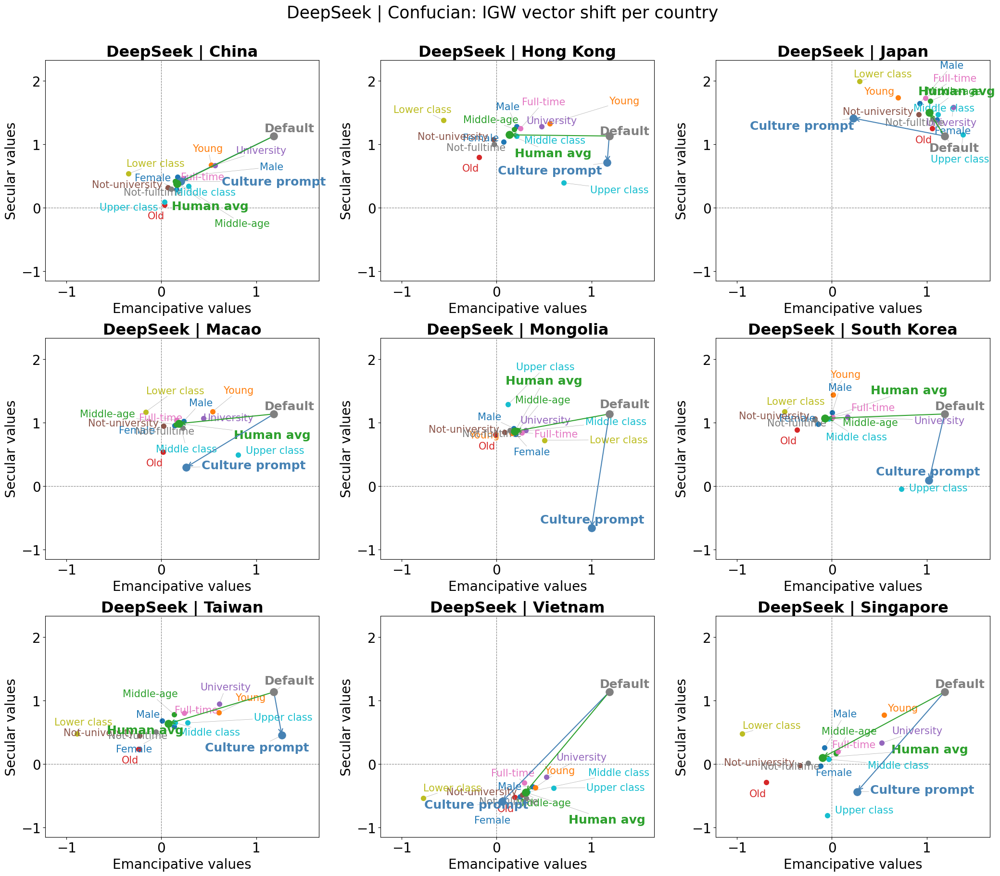

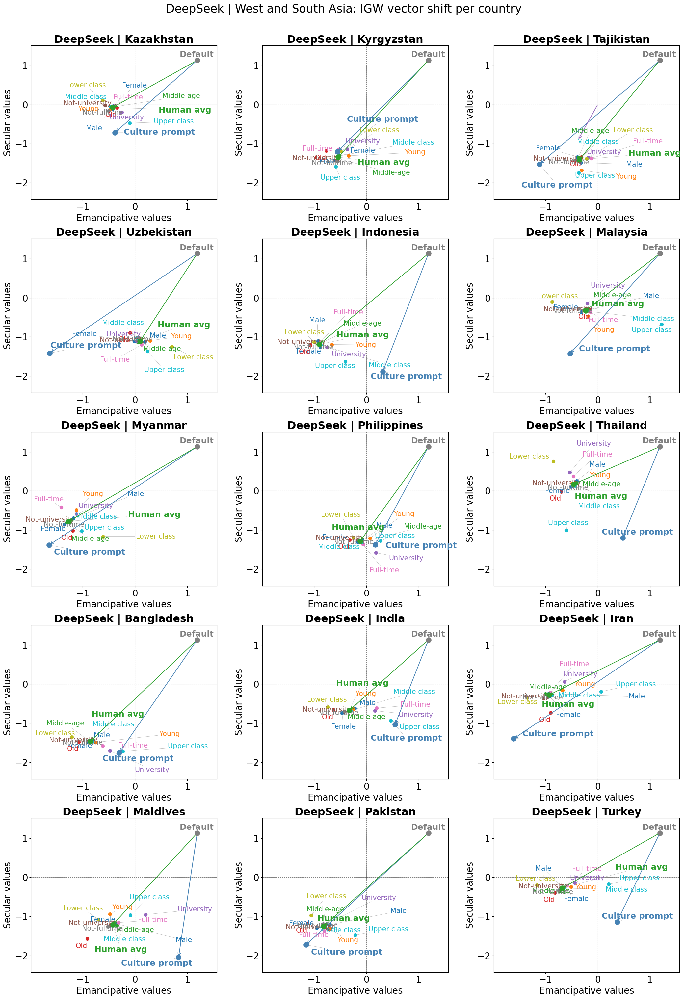

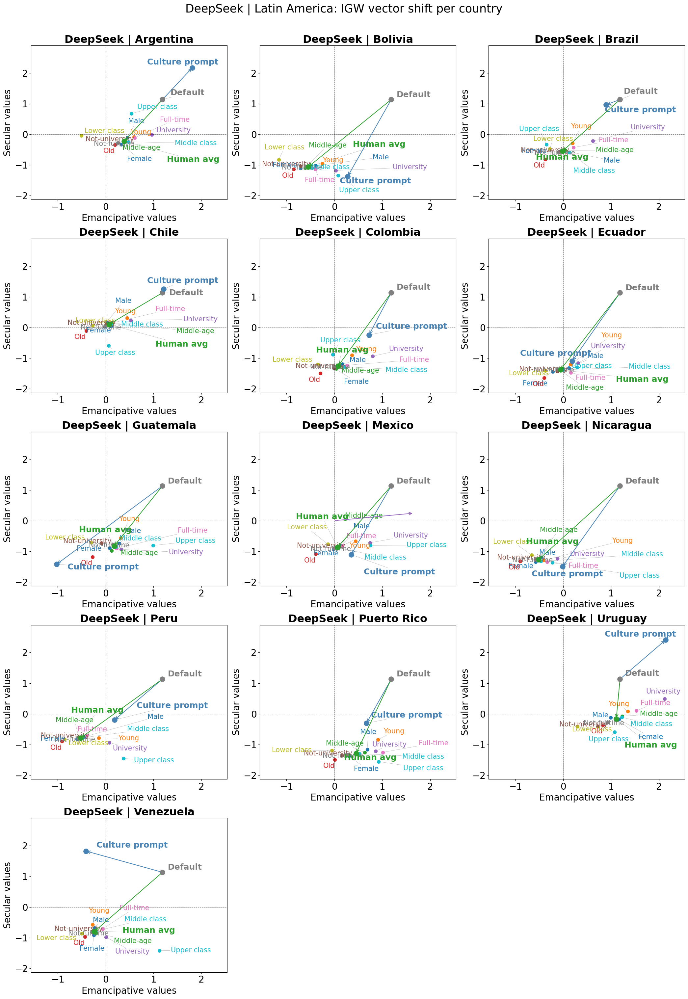

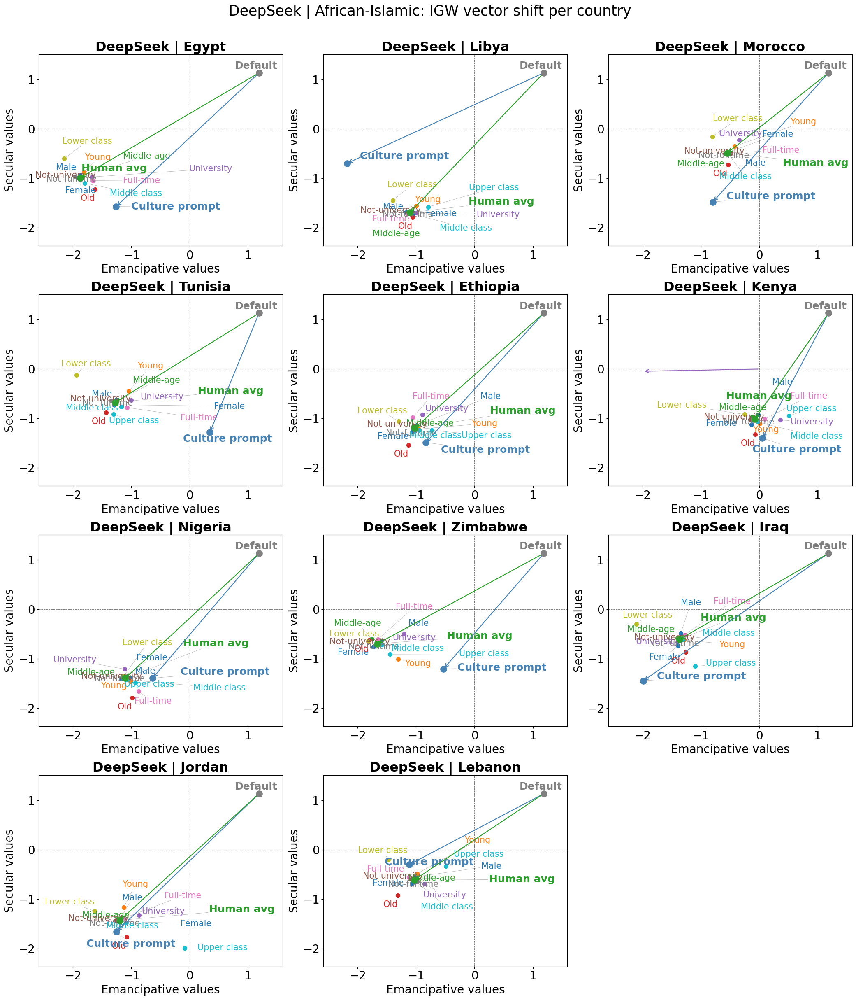

In [35]:
for czone in zone_to_countries:
    visualize_vector_byctry(czone)

------------------------------the end------------------------------